# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [2]:
!mkdir data

mkdir: cannot create directory ‘data’: File exists


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

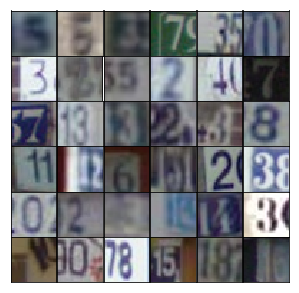

In [5]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. 
First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. 
We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [6]:
# Scale works the same as tanh
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [7]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(self.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Network Inputs

Here, just creating some placeholders like normal.

In [8]:
def model_inputs(real_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    
    return inputs_real

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3.

In [9]:
# tf.layers.conv2d(
#     inputs, ----------
#     filters, -------------
#     kernel_size, ------------
#     strides=(1, 1), ---------------
#     padding='valid', ------------
#     data_format='channels_last', -------------> NHWC and not NCHW
#     dilation_rate=(1, 1), -------------------
#     activation=None,
#     use_bias=True, ------------------
#     kernel_initializer=None,
#     bias_initializer=tf.zeros_initializer(), ------------------
#     kernel_regularizer=None,
#     bias_regularizer=None,
#     activity_regularizer=None,
#     kernel_constraint=None,
#     bias_constraint=None,
#     trainable=True, ---------------------
#     name=None,
#     reuse=None
# )

In [11]:
# Qfunction or qfunction, q/Q is quality and this is used as a classifier or q-learning or q-network
def qfunction(inputs, reuse=False, alpha=0.1, training=True):
    with tf.variable_scope('qfunction', reuse=reuse):
        # Input layer is 32x32x3
        h1 = tf.layers.conv2d(inputs=inputs, filters=64, kernel_size=5, strides=2, padding='same')
        bn1 = tf.layers.batch_normalization(h1, training=training)
        nl1 = tf.maximum(alpha * bn1, bn1)
        # 16x16x64
        
        h2 = tf.layers.conv2d(inputs=nl1, filters=128, kernel_size=5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(h2, training=training)
        nl2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128
        
        h3 = tf.layers.conv2d(inputs=nl2, filters=256, kernel_size=5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(h3, training=training)
        nl3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it to the number of classes 
        # Let's imagine (4*4*512) is the number of classes.
        nl3_vec = tf.reshape(nl3, (-1, 4*4*256))
        logits = tf.layers.dense(nl3_vec, 4*4*512)
        #predictions = tf.nn.softmax(logits)
        
        return logits

In [12]:
def generator(inputs, output_dim, reuse=False, alpha=0.1, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        # Reshape it to start the convolutional stack
        h1_mat = tf.reshape(inputs, (-1, 4, 4, 512))
        # 4x4x512 now
        
        h2 = tf.layers.conv2d_transpose(inputs=h1_mat, filters=256, kernel_size=5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(h2, training=training)
        nl2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x256 now
        
        h3 = tf.layers.conv2d_transpose(inputs=nl2, filters=128, kernel_size=5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(h3, training=training)
        nl3 = tf.maximum(alpha * bn3, bn3)
        # 16x16x128 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(inputs=nl3, filters=output_dim, kernel_size=5, strides=2, padding='same')        
        predictions = tf.tanh(logits)
        # 32x32x3 now

        # generated input or input fake
        return predictions

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've build before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU. 

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

In [13]:
def discriminator(inputs, reuse=False, alpha=0.1, training=True):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        h1 = tf.layers.conv2d(inputs=inputs, filters=64, kernel_size=5, strides=2, padding='same')
        bn1 = tf.layers.batch_normalization(h1, training=training)
        nl1 = tf.maximum(alpha * bn1, bn1)
        # 16x16x64
        
        h2 = tf.layers.conv2d(inputs=nl1, filters=128, kernel_size=5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(h2, training=training)
        nl2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128
        
        h3 = tf.layers.conv2d(inputs=nl2, filters=256, kernel_size=5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(h3, training=training)
        nl3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        nl3_vec = tf.reshape(nl3, (-1, 4*4*256))
        logits = tf.layers.dense(nl3_vec, 1)
        # predictions = tf.sigmoid(logits)
        
        return logits

## Model Loss

Calculating the loss like before, nothing new here.

In [14]:
def model_loss(inputs_real, output_dim):
    """
    Get the loss for the discriminator and generator
    :param inputs_real: Images from the real dataset
    :param output_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # Generating/reconstructing the fake inputs using real inputs
    q_logits = qfunction(inputs=inputs_real)
    inputs_fake = generator(inputs=q_logits, output_dim=output_dim)

    # Qfunction loss using real and fake inputs
    q_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=inputs_fake, labels=tf.sigmoid(inputs_real)))
    # q_loss = tf.reduce_mean(tf.losses.mean_squared_error(predictions=input_fake, labels=input_real))
    # TODO: is there any classification error we can backpropagate here!

    # Discriminator logits fake and real for G & D losses
    d_logits_fake = discriminator(inputs=inputs_fake, reuse=False)
    d_logits_real = discriminator(inputs=inputs_real, reuse=True)

    # Generator loss
    g_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.zeros_like(d_logits_real)))
    g_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_logits_fake)))
    g_loss = g_loss_real + g_loss_fake

    # Discriminator loss
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_logits_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_logits_fake)))
    d_loss = d_loss_real + d_loss_fake
    
    return q_loss, g_loss, d_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [15]:
def model_opt(q_loss, g_loss, d_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param q_loss: Qfunction loss Tensor
    :param g_loss: Generator loss Tensor
    :param d_loss: Discriminator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    q_vars = [var for var in t_vars if var.name.startswith('qfunction')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        q_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(q_loss, var_list=q_vars)
        g_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
        d_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)

    return q_opt, g_opt, d_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [16]:
class GAN:
    def __init__(self, real_size, learning_rate, beta1):
        tf.reset_default_graph()
        
        # Model inputs/data 
        self.inputs_real = model_inputs(real_dim=real_size)
        
        # Model losses/logits
        self.q_loss, self.g_loss, self.d_loss = model_loss(inputs_real=self.inputs_real, output_dim=real_size[2])

        # Model update/optimization
        self.q_opt, self.g_opt, self.d_opt = model_opt(q_loss=self.q_loss, 
                                                       g_loss=self.g_loss, 
                                                       d_loss=self.d_loss, 
                                                       learning_rate=learning_rate, beta1=beta1)

Here is a function for displaying generated images.

In [17]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [18]:
def train(model, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    samples, losses = [], []
    steps = 0

    # Creating a session for training
    with tf.Session() as sess:
        
        # Initialize the model variable if there is no model available to load/restore
        sess.run(tf.global_variables_initializer())
        
        # Restore/load the trained model
        #saver.restore(sess, './checkpoints/Auto-DCGAN.ckpt')
        saver.restore(sess, tf.train.latest_checkpoint('checkpoints/'))
        
        # Number of epochs for updating the model/s
        for e in range(epochs):
            
            # Training batches
            for inputs_real, _ in dataset.batches(batch_size):
                steps += 1

                # Run optimizers
                feed_dict={model.inputs_real: inputs_real}
                _ = sess.run(model.q_opt, feed_dict)
                _ = sess.run(model.g_opt, feed_dict)
                _ = sess.run(model.d_opt, feed_dict)

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    q_loss = model.q_loss.eval(feed_dict)
                    g_loss = model.g_loss.eval(feed_dict)
                    d_loss = model.d_loss.eval(feed_dict)

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Qfunction Loss: {}".format(q_loss),
                          "Generator Loss: {}".format(g_loss),
                          "Discriminator Loss: {}".format(d_loss))
                    
                    # Save losses to view after training
                    losses.append((q_loss, g_loss, d_loss))

                if steps % show_every == 0:
                    model_qlogits = qfunction(inputs=model.inputs_real, reuse=True, training=False)
                    model_reconst_inputs = generator(inputs=model_qlogits, output_dim=3, reuse=True, training=False)
                    reconst_inputs = sess.run(model_reconst_inputs, feed_dict)
                    samples.append(reconst_inputs)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        # Save the trained model
        saver.save(sess, './checkpoints/Auto-DCGAN.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

In [19]:
# ADAM default parameters
# __init__(
#     learning_rate=0.001,
#     beta1=0.9,
#     beta2=0.999,
#     epsilon=1e-08,
#     use_locking=False,
#     name='Adam'
# )

In [20]:
real_size = (32,32,3)
learning_rate = 0.001
beta1 = 0.5
batch_size = 128
epochs = 10
alpha = 0.1

# Create the network
model = GAN(real_size=real_size, learning_rate=learning_rate, beta1=beta1)

In [21]:
# Dataset for the model
dataset = Dataset(trainset, testset)

INFO:tensorflow:Restoring parameters from checkpoints/Auto-DCGAN.ckpt
Epoch 1/10... Qfunction Loss: 0.6807873845100403 Generator Loss: 10.4495210647583 Discriminator Loss: 0.10238189995288849
Epoch 1/10... Qfunction Loss: 0.6880671977996826 Generator Loss: 9.572539329528809 Discriminator Loss: 0.05701598897576332
Epoch 1/10... Qfunction Loss: 0.6893842816352844 Generator Loss: 8.337682723999023 Discriminator Loss: 0.06066171079874039
Epoch 1/10... Qfunction Loss: 0.6820311546325684 Generator Loss: 11.201644897460938 Discriminator Loss: 0.041700512170791626
Epoch 1/10... Qfunction Loss: 0.6816661357879639 Generator Loss: 9.955888748168945 Discriminator Loss: 0.036208465695381165
Epoch 1/10... Qfunction Loss: 0.6783348917961121 Generator Loss: 7.309292316436768 Discriminator Loss: 0.10613515973091125
Epoch 1/10... Qfunction Loss: 0.6862276196479797 Generator Loss: 13.477896690368652 Discriminator Loss: 0.022546734660863876
Epoch 1/10... Qfunction Loss: 0.6808738708496094 Generator Loss: 

/home/arasdar/anaconda3/envs/env/lib/python3.6/site-packages/matplotlib/axes/_base.py:1400: MatplotlibDeprecationWarning: The 'box-forced' keyword argument is deprecated since 2.2.
  " since 2.2.", cbook.mplDeprecation)


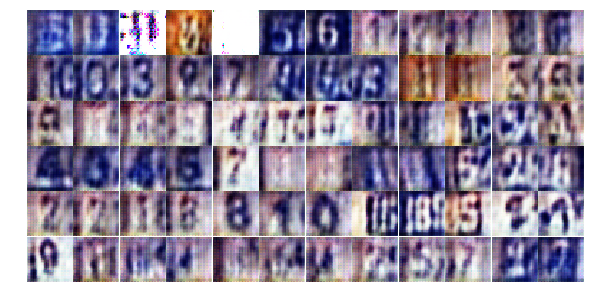

Epoch 1/10... Qfunction Loss: 0.6810277104377747 Generator Loss: 10.429706573486328 Discriminator Loss: 0.1120353639125824
Epoch 1/10... Qfunction Loss: 0.6903908848762512 Generator Loss: 10.314143180847168 Discriminator Loss: 0.18015912175178528
Epoch 1/10... Qfunction Loss: 0.6842036247253418 Generator Loss: 7.499363899230957 Discriminator Loss: 0.17340107262134552
Epoch 1/10... Qfunction Loss: 0.6867865920066833 Generator Loss: 11.331036567687988 Discriminator Loss: 0.02850147895514965
Epoch 1/10... Qfunction Loss: 0.6823749542236328 Generator Loss: 11.850406646728516 Discriminator Loss: 0.03061089850962162
Epoch 1/10... Qfunction Loss: 0.6846332550048828 Generator Loss: 11.148715019226074 Discriminator Loss: 0.021655669435858727
Epoch 1/10... Qfunction Loss: 0.682452380657196 Generator Loss: 7.6658525466918945 Discriminator Loss: 0.16781434416770935
Epoch 1/10... Qfunction Loss: 0.6839056611061096 Generator Loss: 6.368286609649658 Discriminator Loss: 0.41153690218925476
Epoch 1/10.

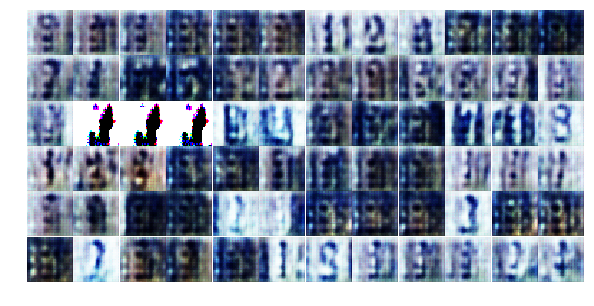

Epoch 1/10... Qfunction Loss: 0.6909499764442444 Generator Loss: 11.351404190063477 Discriminator Loss: 0.02179948426783085
Epoch 1/10... Qfunction Loss: 0.6899607181549072 Generator Loss: 11.577836036682129 Discriminator Loss: 0.02462797611951828
Epoch 1/10... Qfunction Loss: 0.6903182864189148 Generator Loss: 12.51375961303711 Discriminator Loss: 0.014935300685465336
Epoch 1/10... Qfunction Loss: 0.6933050155639648 Generator Loss: 12.155332565307617 Discriminator Loss: 0.038488272577524185
Epoch 1/10... Qfunction Loss: 0.6900668144226074 Generator Loss: 13.364051818847656 Discriminator Loss: 0.009342445060610771
Epoch 1/10... Qfunction Loss: 0.6972950100898743 Generator Loss: 16.358810424804688 Discriminator Loss: 0.00985155813395977
Epoch 1/10... Qfunction Loss: 0.6890265345573425 Generator Loss: 12.97372055053711 Discriminator Loss: 0.009180111810564995
Epoch 1/10... Qfunction Loss: 0.6908379197120667 Generator Loss: 13.355939865112305 Discriminator Loss: 0.00579385319724679
Epoch 

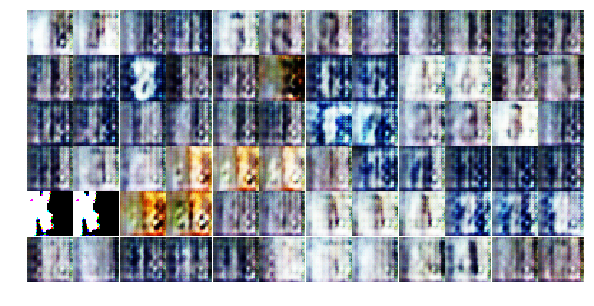

Epoch 1/10... Qfunction Loss: 0.6914240717887878 Generator Loss: 17.140514373779297 Discriminator Loss: 0.00475022429600358
Epoch 1/10... Qfunction Loss: 0.6863057017326355 Generator Loss: 12.9230375289917 Discriminator Loss: 0.016663143411278725
Epoch 1/10... Qfunction Loss: 0.6928324699401855 Generator Loss: 12.044814109802246 Discriminator Loss: 0.018562888726592064
Epoch 1/10... Qfunction Loss: 0.6970223784446716 Generator Loss: 18.00615119934082 Discriminator Loss: 0.02150685340166092
Epoch 1/10... Qfunction Loss: 0.6903794407844543 Generator Loss: 14.357712745666504 Discriminator Loss: 0.0044752806425094604
Epoch 1/10... Qfunction Loss: 0.6925604939460754 Generator Loss: 11.01244831085205 Discriminator Loss: 0.021148672327399254
Epoch 1/10... Qfunction Loss: 0.6845932006835938 Generator Loss: 14.659585952758789 Discriminator Loss: 0.008992496877908707
Epoch 1/10... Qfunction Loss: 0.6933916211128235 Generator Loss: 16.178842544555664 Discriminator Loss: 0.004389709793031216
Epoch

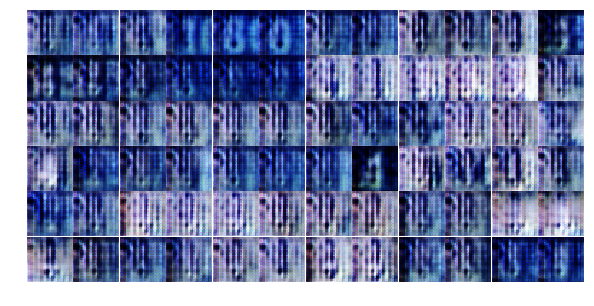

Epoch 1/10... Qfunction Loss: 0.6858661770820618 Generator Loss: 16.09572982788086 Discriminator Loss: 0.0018040258437395096
Epoch 1/10... Qfunction Loss: 0.685420036315918 Generator Loss: 16.154069900512695 Discriminator Loss: 0.0018055130494758487
Epoch 1/10... Qfunction Loss: 0.6880417466163635 Generator Loss: 14.506027221679688 Discriminator Loss: 0.00370460981503129
Epoch 1/10... Qfunction Loss: 0.6900895237922668 Generator Loss: 11.283327102661133 Discriminator Loss: 0.01665589213371277
Epoch 1/10... Qfunction Loss: 0.682750403881073 Generator Loss: 15.821321487426758 Discriminator Loss: 0.0026659215800464153
Epoch 1/10... Qfunction Loss: 0.6856678128242493 Generator Loss: 12.376541137695312 Discriminator Loss: 0.09670187532901764
Epoch 1/10... Qfunction Loss: 0.693167507648468 Generator Loss: 13.413789749145508 Discriminator Loss: 0.008619239553809166
Epoch 1/10... Qfunction Loss: 0.6878110766410828 Generator Loss: 10.207340240478516 Discriminator Loss: 0.03214827924966812
Epoch

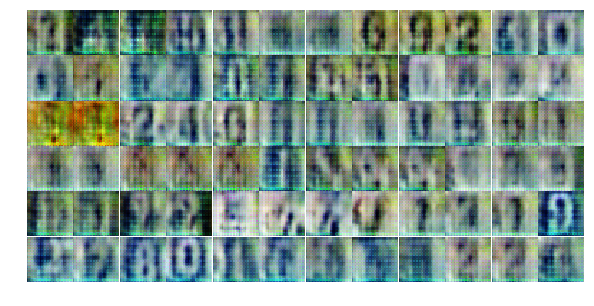

Epoch 1/10... Qfunction Loss: 0.6908882260322571 Generator Loss: 17.14952278137207 Discriminator Loss: 0.010449540801346302
Epoch 1/10... Qfunction Loss: 0.6847174763679504 Generator Loss: 13.2842435836792 Discriminator Loss: 0.008980495855212212
Epoch 1/10... Qfunction Loss: 0.6897228360176086 Generator Loss: 11.251558303833008 Discriminator Loss: 0.01770123466849327
Epoch 1/10... Qfunction Loss: 0.6975753903388977 Generator Loss: 11.132540702819824 Discriminator Loss: 0.02161513827741146
Epoch 1/10... Qfunction Loss: 0.6971845030784607 Generator Loss: 10.281646728515625 Discriminator Loss: 0.027917906641960144
Epoch 1/10... Qfunction Loss: 0.6933785080909729 Generator Loss: 13.667923927307129 Discriminator Loss: 0.00617565494030714
Epoch 1/10... Qfunction Loss: 0.687752902507782 Generator Loss: 10.482736587524414 Discriminator Loss: 0.0919550359249115
Epoch 2/10... Qfunction Loss: 0.6897525787353516 Generator Loss: 9.921051025390625 Discriminator Loss: 0.03670667111873627
Epoch 2/10.

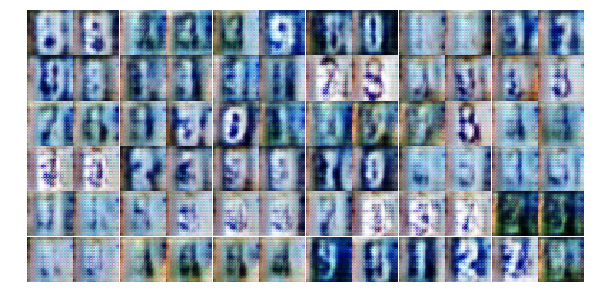

Epoch 2/10... Qfunction Loss: 0.6841349601745605 Generator Loss: 10.217865943908691 Discriminator Loss: 0.06731145828962326
Epoch 2/10... Qfunction Loss: 0.6895988583564758 Generator Loss: 11.176067352294922 Discriminator Loss: 0.032229553908109665
Epoch 2/10... Qfunction Loss: 0.6852560639381409 Generator Loss: 12.029558181762695 Discriminator Loss: 0.020146958529949188
Epoch 2/10... Qfunction Loss: 0.686180591583252 Generator Loss: 13.20704174041748 Discriminator Loss: 0.008079282939434052
Epoch 2/10... Qfunction Loss: 0.6827160716056824 Generator Loss: 11.514883041381836 Discriminator Loss: 0.015227247029542923
Epoch 2/10... Qfunction Loss: 0.6840645670890808 Generator Loss: 11.133098602294922 Discriminator Loss: 0.02337554842233658
Epoch 2/10... Qfunction Loss: 0.6825640201568604 Generator Loss: 12.360048294067383 Discriminator Loss: 0.01045359019190073
Epoch 2/10... Qfunction Loss: 0.681826114654541 Generator Loss: 9.44915771484375 Discriminator Loss: 0.25153714418411255
Epoch 2/1

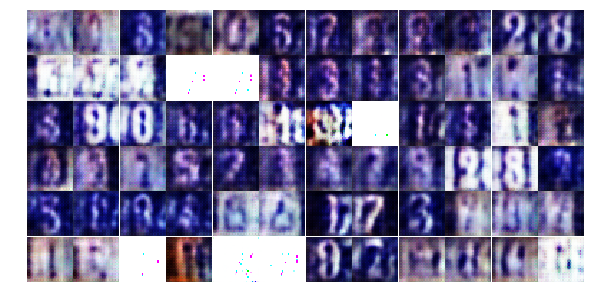

Epoch 2/10... Qfunction Loss: 0.6767594814300537 Generator Loss: 10.54033088684082 Discriminator Loss: 0.0196550153195858
Epoch 2/10... Qfunction Loss: 0.6851298213005066 Generator Loss: 12.40313720703125 Discriminator Loss: 0.019272495061159134
Epoch 2/10... Qfunction Loss: 0.686817467212677 Generator Loss: 10.620092391967773 Discriminator Loss: 0.02343028411269188
Epoch 2/10... Qfunction Loss: 0.6906068921089172 Generator Loss: 12.370933532714844 Discriminator Loss: 0.07619915157556534
Epoch 2/10... Qfunction Loss: 0.6802722811698914 Generator Loss: 11.649452209472656 Discriminator Loss: 0.02002173289656639
Epoch 2/10... Qfunction Loss: 0.6910029053688049 Generator Loss: 12.34092903137207 Discriminator Loss: 0.01344496663659811
Epoch 2/10... Qfunction Loss: 0.6793807148933411 Generator Loss: 13.766425132751465 Discriminator Loss: 0.01096477173268795
Epoch 2/10... Qfunction Loss: 0.6799095273017883 Generator Loss: 11.6104154586792 Discriminator Loss: 0.012608924880623817
Epoch 2/10...

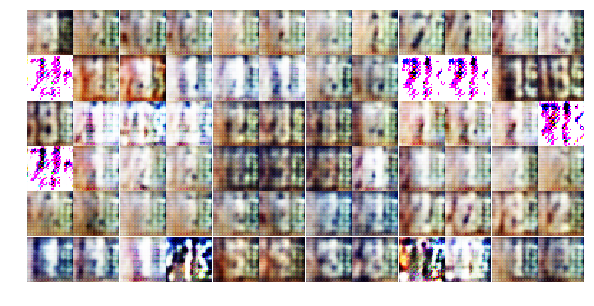

Epoch 2/10... Qfunction Loss: 0.6921822428703308 Generator Loss: 10.757927894592285 Discriminator Loss: 0.02586657926440239
Epoch 2/10... Qfunction Loss: 0.6843717694282532 Generator Loss: 11.283411026000977 Discriminator Loss: 0.03123236820101738
Epoch 2/10... Qfunction Loss: 0.6938216090202332 Generator Loss: 13.042301177978516 Discriminator Loss: 0.011960159055888653
Epoch 2/10... Qfunction Loss: 0.6917136311531067 Generator Loss: 14.542778015136719 Discriminator Loss: 0.006749569904059172
Epoch 2/10... Qfunction Loss: 0.7003495693206787 Generator Loss: 13.532882690429688 Discriminator Loss: 0.010246112011373043
Epoch 2/10... Qfunction Loss: 0.6918300986289978 Generator Loss: 14.2972412109375 Discriminator Loss: 0.005744956433773041
Epoch 2/10... Qfunction Loss: 0.6853978037834167 Generator Loss: 12.219522476196289 Discriminator Loss: 0.016214270144701004
Epoch 2/10... Qfunction Loss: 0.685978889465332 Generator Loss: 18.138256072998047 Discriminator Loss: 0.0027545050252228975
Epoc

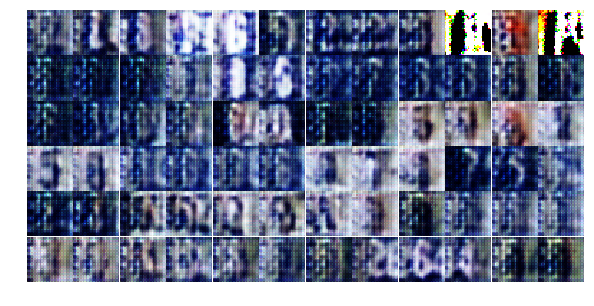

Epoch 2/10... Qfunction Loss: 0.6800284385681152 Generator Loss: 13.163256645202637 Discriminator Loss: 0.009026000276207924
Epoch 2/10... Qfunction Loss: 0.6866618990898132 Generator Loss: 12.186737060546875 Discriminator Loss: 0.012145094573497772
Epoch 2/10... Qfunction Loss: 0.6863350868225098 Generator Loss: 14.972549438476562 Discriminator Loss: 0.004057609476149082
Epoch 2/10... Qfunction Loss: 0.6915746331214905 Generator Loss: 15.438396453857422 Discriminator Loss: 0.004353494383394718
Epoch 2/10... Qfunction Loss: 0.6967217922210693 Generator Loss: 13.462356567382812 Discriminator Loss: 0.004950469359755516
Epoch 2/10... Qfunction Loss: 0.6916043162345886 Generator Loss: 15.422633171081543 Discriminator Loss: 0.00423006946220994
Epoch 2/10... Qfunction Loss: 0.6887888312339783 Generator Loss: 14.364084243774414 Discriminator Loss: 0.006483337841928005
Epoch 2/10... Qfunction Loss: 0.6959995627403259 Generator Loss: 13.122905731201172 Discriminator Loss: 0.007391657214611769
E

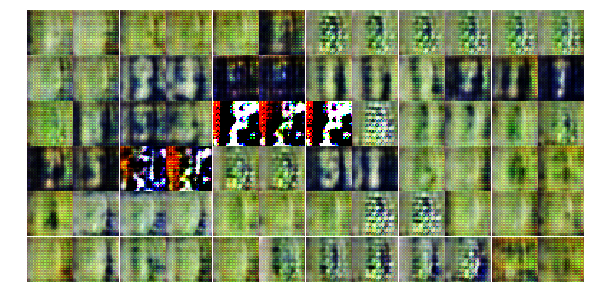

Epoch 2/10... Qfunction Loss: 0.6904255747795105 Generator Loss: 17.011016845703125 Discriminator Loss: 0.0022396882995963097
Epoch 2/10... Qfunction Loss: 0.6921928524971008 Generator Loss: 15.977876663208008 Discriminator Loss: 0.0025139248464256525
Epoch 2/10... Qfunction Loss: 0.6870939135551453 Generator Loss: 14.396927833557129 Discriminator Loss: 0.005103574600070715
Epoch 2/10... Qfunction Loss: 0.6895120739936829 Generator Loss: 19.54537582397461 Discriminator Loss: 0.07178603857755661
Epoch 2/10... Qfunction Loss: 0.6955916881561279 Generator Loss: 12.655256271362305 Discriminator Loss: 0.013762487098574638
Epoch 2/10... Qfunction Loss: 0.6774131655693054 Generator Loss: 15.105133056640625 Discriminator Loss: 0.010408715344965458
Epoch 2/10... Qfunction Loss: 0.6903287768363953 Generator Loss: 14.371150016784668 Discriminator Loss: 0.06764192879199982
Epoch 2/10... Qfunction Loss: 0.6888396143913269 Generator Loss: 13.650439262390137 Discriminator Loss: 0.007515307050198317
E

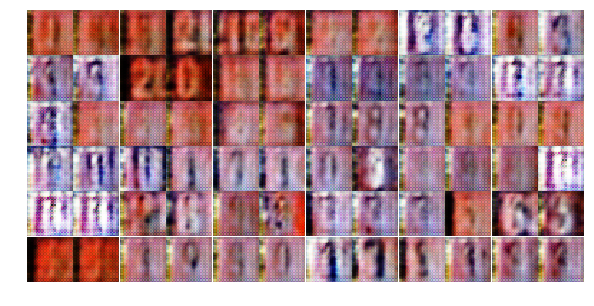

Epoch 2/10... Qfunction Loss: 0.6803834438323975 Generator Loss: 12.867532730102539 Discriminator Loss: 0.010375304147601128
Epoch 2/10... Qfunction Loss: 0.6923573613166809 Generator Loss: 12.616130828857422 Discriminator Loss: 0.009456880390644073
Epoch 2/10... Qfunction Loss: 0.6786559224128723 Generator Loss: 14.737273216247559 Discriminator Loss: 0.00410752696916461
Epoch 2/10... Qfunction Loss: 0.6844465136528015 Generator Loss: 17.0354061126709 Discriminator Loss: 0.0015938926953822374
Epoch 3/10... Qfunction Loss: 0.6832420229911804 Generator Loss: 13.930248260498047 Discriminator Loss: 0.008891615085303783
Epoch 3/10... Qfunction Loss: 0.6793026328086853 Generator Loss: 10.242643356323242 Discriminator Loss: 0.027836959809064865
Epoch 3/10... Qfunction Loss: 0.6904274821281433 Generator Loss: 18.717708587646484 Discriminator Loss: 0.0010184524580836296
Epoch 3/10... Qfunction Loss: 0.6837618350982666 Generator Loss: 17.056549072265625 Discriminator Loss: 0.013395072892308235
E

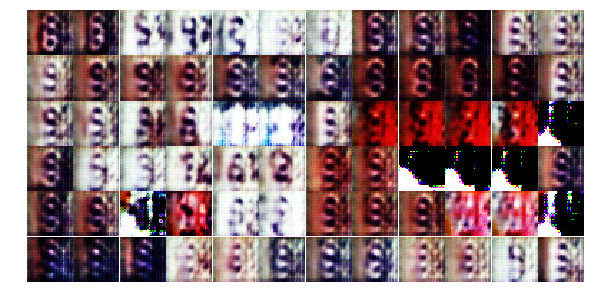

Epoch 3/10... Qfunction Loss: 0.6868842244148254 Generator Loss: 13.308058738708496 Discriminator Loss: 0.007533135358244181
Epoch 3/10... Qfunction Loss: 0.6902370452880859 Generator Loss: 12.642206192016602 Discriminator Loss: 0.007675458677113056
Epoch 3/10... Qfunction Loss: 0.6847127079963684 Generator Loss: 11.698619842529297 Discriminator Loss: 0.01603025570511818
Epoch 3/10... Qfunction Loss: 0.6874045729637146 Generator Loss: 12.482632637023926 Discriminator Loss: 0.008744895458221436
Epoch 3/10... Qfunction Loss: 0.6859031319618225 Generator Loss: 17.014083862304688 Discriminator Loss: 0.0011252721305936575
Epoch 3/10... Qfunction Loss: 0.6837312579154968 Generator Loss: 13.384063720703125 Discriminator Loss: 0.00995674915611744
Epoch 3/10... Qfunction Loss: 0.7054088711738586 Generator Loss: 19.471010208129883 Discriminator Loss: 0.00830037146806717
Epoch 3/10... Qfunction Loss: 0.7010872960090637 Generator Loss: 18.448036193847656 Discriminator Loss: 0.0015484848991036415
E

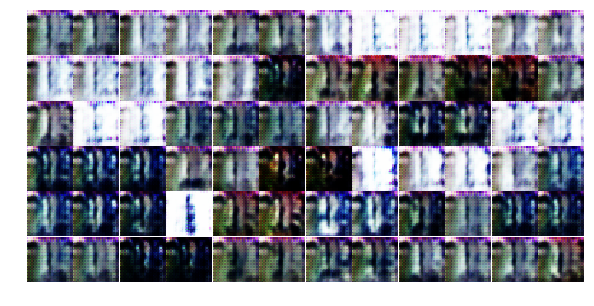

Epoch 3/10... Qfunction Loss: 0.6958950161933899 Generator Loss: 13.396249771118164 Discriminator Loss: 0.013997959904372692
Epoch 3/10... Qfunction Loss: 0.6991879343986511 Generator Loss: 17.662620544433594 Discriminator Loss: 0.0013705637538805604
Epoch 3/10... Qfunction Loss: 0.6885814070701599 Generator Loss: 14.440824508666992 Discriminator Loss: 0.009801413863897324
Epoch 3/10... Qfunction Loss: 0.685333788394928 Generator Loss: 13.604860305786133 Discriminator Loss: 0.00880032405257225
Epoch 3/10... Qfunction Loss: 0.6823435425758362 Generator Loss: 8.651885986328125 Discriminator Loss: 0.4297159016132355
Epoch 3/10... Qfunction Loss: 0.68380206823349 Generator Loss: 10.549588203430176 Discriminator Loss: 0.036878034472465515
Epoch 3/10... Qfunction Loss: 0.6991615295410156 Generator Loss: 10.610344886779785 Discriminator Loss: 1.4583665132522583
Epoch 3/10... Qfunction Loss: 0.6800306439399719 Generator Loss: 8.778650283813477 Discriminator Loss: 0.06883023679256439
Epoch 3/10

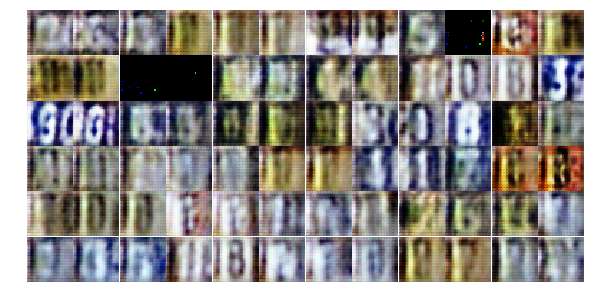

Epoch 3/10... Qfunction Loss: 0.6973476409912109 Generator Loss: 15.056718826293945 Discriminator Loss: 0.004794194363057613
Epoch 3/10... Qfunction Loss: 0.691018283367157 Generator Loss: 12.418990135192871 Discriminator Loss: 0.05548671633005142
Epoch 3/10... Qfunction Loss: 0.6776137351989746 Generator Loss: 10.046926498413086 Discriminator Loss: 0.03404650837182999
Epoch 3/10... Qfunction Loss: 0.6744349002838135 Generator Loss: 8.36788272857666 Discriminator Loss: 0.30956098437309265
Epoch 3/10... Qfunction Loss: 0.6806337833404541 Generator Loss: 12.129674911499023 Discriminator Loss: 0.019502077251672745
Epoch 3/10... Qfunction Loss: 0.692506730556488 Generator Loss: 18.04952621459961 Discriminator Loss: 0.009835603646934032
Epoch 3/10... Qfunction Loss: 0.6968199610710144 Generator Loss: 16.320171356201172 Discriminator Loss: 0.0026099937967956066
Epoch 3/10... Qfunction Loss: 0.6883373260498047 Generator Loss: 9.669195175170898 Discriminator Loss: 0.057661741971969604
Epoch 3/

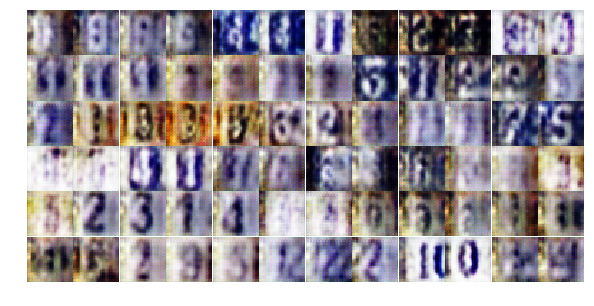

Epoch 3/10... Qfunction Loss: 0.6793387532234192 Generator Loss: 12.142277717590332 Discriminator Loss: 0.08157224208116531
Epoch 3/10... Qfunction Loss: 0.6808525919914246 Generator Loss: 15.19274616241455 Discriminator Loss: 0.008802958764135838
Epoch 3/10... Qfunction Loss: 0.7092081904411316 Generator Loss: 19.73800277709961 Discriminator Loss: 0.0004992534522898495
Epoch 3/10... Qfunction Loss: 0.6839678883552551 Generator Loss: 14.229293823242188 Discriminator Loss: 0.005199798382818699
Epoch 3/10... Qfunction Loss: 0.7106443047523499 Generator Loss: 12.84693717956543 Discriminator Loss: 0.010923974215984344
Epoch 3/10... Qfunction Loss: 0.6823954582214355 Generator Loss: 13.045795440673828 Discriminator Loss: 0.008028341457247734
Epoch 3/10... Qfunction Loss: 0.6858737468719482 Generator Loss: 13.99233627319336 Discriminator Loss: 0.00882043968886137
Epoch 3/10... Qfunction Loss: 0.684136688709259 Generator Loss: 15.320198059082031 Discriminator Loss: 0.005049685947597027
Epoch 

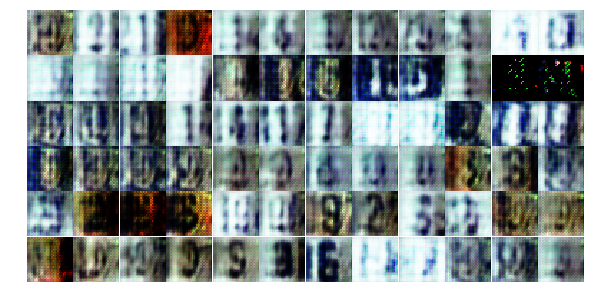

Epoch 3/10... Qfunction Loss: 0.6864926218986511 Generator Loss: 14.705269813537598 Discriminator Loss: 0.008167851716279984
Epoch 3/10... Qfunction Loss: 0.6904540061950684 Generator Loss: 12.618707656860352 Discriminator Loss: 0.009876957163214684
Epoch 3/10... Qfunction Loss: 0.7118698954582214 Generator Loss: 9.978474617004395 Discriminator Loss: 0.5164644122123718
Epoch 3/10... Qfunction Loss: 0.6846005320549011 Generator Loss: 9.59560775756836 Discriminator Loss: 0.05916600301861763
Epoch 3/10... Qfunction Loss: 0.7155230641365051 Generator Loss: 14.567895889282227 Discriminator Loss: 0.015377024188637733
Epoch 3/10... Qfunction Loss: 0.6810910105705261 Generator Loss: 13.965621948242188 Discriminator Loss: 0.013540972024202347
Epoch 3/10... Qfunction Loss: 0.6895248293876648 Generator Loss: 15.526843070983887 Discriminator Loss: 0.007445849943906069
Epoch 3/10... Qfunction Loss: 0.6910945773124695 Generator Loss: 11.481512069702148 Discriminator Loss: 0.07767792791128159
Epoch 3

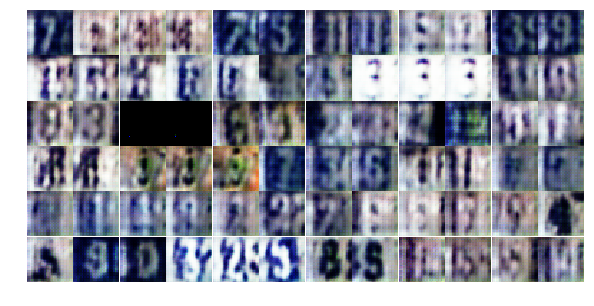

Epoch 3/10... Qfunction Loss: 0.6832151412963867 Generator Loss: 7.666986465454102 Discriminator Loss: 0.22114211320877075
Epoch 4/10... Qfunction Loss: 0.687483012676239 Generator Loss: 11.72215747833252 Discriminator Loss: 0.022456496953964233
Epoch 4/10... Qfunction Loss: 0.6856136918067932 Generator Loss: 13.621875762939453 Discriminator Loss: 0.07974092662334442
Epoch 4/10... Qfunction Loss: 0.6787856221199036 Generator Loss: 9.31341552734375 Discriminator Loss: 0.05032394826412201
Epoch 4/10... Qfunction Loss: 0.6823895573616028 Generator Loss: 11.625690460205078 Discriminator Loss: 0.015455132350325584
Epoch 4/10... Qfunction Loss: 0.6819705963134766 Generator Loss: 13.489055633544922 Discriminator Loss: 0.015083358623087406
Epoch 4/10... Qfunction Loss: 0.6803352236747742 Generator Loss: 8.418268203735352 Discriminator Loss: 0.09104268252849579
Epoch 4/10... Qfunction Loss: 0.6851749420166016 Generator Loss: 12.45135498046875 Discriminator Loss: 0.010547280311584473
Epoch 4/10.

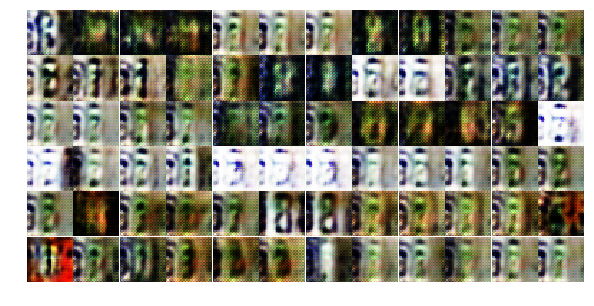

Epoch 4/10... Qfunction Loss: 0.6900360584259033 Generator Loss: 11.810478210449219 Discriminator Loss: 0.063758984208107
Epoch 4/10... Qfunction Loss: 0.7608837485313416 Generator Loss: 16.287988662719727 Discriminator Loss: 0.003157998900860548
Epoch 4/10... Qfunction Loss: 0.6809884905815125 Generator Loss: 11.445451736450195 Discriminator Loss: 0.016648782417178154
Epoch 4/10... Qfunction Loss: 0.6829107403755188 Generator Loss: 16.50679588317871 Discriminator Loss: 0.0015562658663839102
Epoch 4/10... Qfunction Loss: 0.6929597854614258 Generator Loss: 10.443500518798828 Discriminator Loss: 0.04460377246141434
Epoch 4/10... Qfunction Loss: 0.6836994290351868 Generator Loss: 12.700955390930176 Discriminator Loss: 0.009141016751527786
Epoch 4/10... Qfunction Loss: 0.7166406512260437 Generator Loss: 16.607927322387695 Discriminator Loss: 0.0019123456440865993
Epoch 4/10... Qfunction Loss: 0.698549211025238 Generator Loss: 13.021536827087402 Discriminator Loss: 0.010397211648523808
Epoc

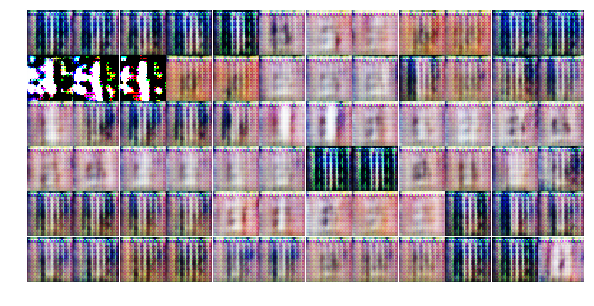

Epoch 4/10... Qfunction Loss: 0.7047693729400635 Generator Loss: 17.236154556274414 Discriminator Loss: 0.0029424240346997976
Epoch 4/10... Qfunction Loss: 0.7001900672912598 Generator Loss: 16.966094970703125 Discriminator Loss: 0.0032113762572407722
Epoch 4/10... Qfunction Loss: 0.6986021995544434 Generator Loss: 14.637414932250977 Discriminator Loss: 0.007870337925851345
Epoch 4/10... Qfunction Loss: 0.6987218856811523 Generator Loss: 17.596960067749023 Discriminator Loss: 0.001792183960787952
Epoch 4/10... Qfunction Loss: 0.6956579089164734 Generator Loss: 14.285072326660156 Discriminator Loss: 0.0061199720948934555
Epoch 4/10... Qfunction Loss: 0.6922906041145325 Generator Loss: 15.753483772277832 Discriminator Loss: 0.002958489116281271
Epoch 4/10... Qfunction Loss: 0.6931834816932678 Generator Loss: 15.448081016540527 Discriminator Loss: 0.0028099017217755318
Epoch 4/10... Qfunction Loss: 0.6918423175811768 Generator Loss: 15.182151794433594 Discriminator Loss: 0.006308167241513

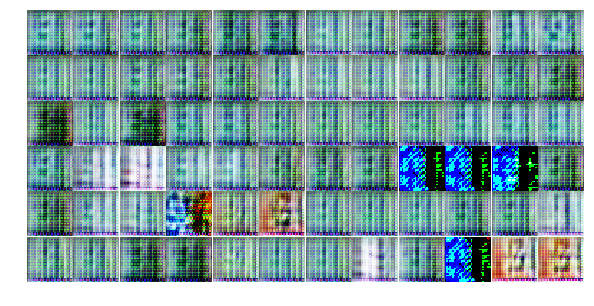

Epoch 4/10... Qfunction Loss: 0.6963508725166321 Generator Loss: 13.958974838256836 Discriminator Loss: 0.009194990620017052
Epoch 4/10... Qfunction Loss: 0.7041098475456238 Generator Loss: 14.529071807861328 Discriminator Loss: 0.005012827459722757
Epoch 4/10... Qfunction Loss: 0.7043790817260742 Generator Loss: 13.933744430541992 Discriminator Loss: 0.0045096552930772305
Epoch 4/10... Qfunction Loss: 0.708570659160614 Generator Loss: 16.217620849609375 Discriminator Loss: 0.002815759275108576
Epoch 4/10... Qfunction Loss: 0.7074880599975586 Generator Loss: 15.72355842590332 Discriminator Loss: 0.003265006234869361
Epoch 4/10... Qfunction Loss: 0.7068178057670593 Generator Loss: 13.70461654663086 Discriminator Loss: 0.007417299319058657
Epoch 4/10... Qfunction Loss: 0.7181897163391113 Generator Loss: 13.925021171569824 Discriminator Loss: 0.00804347638040781
Epoch 4/10... Qfunction Loss: 0.7020900845527649 Generator Loss: 17.315814971923828 Discriminator Loss: 0.0009624146623536944
Ep

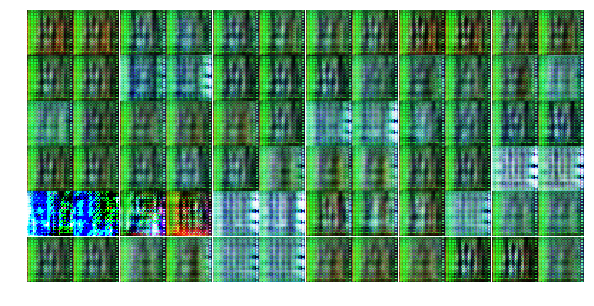

Epoch 4/10... Qfunction Loss: 0.7166960835456848 Generator Loss: 23.525188446044922 Discriminator Loss: 0.00037414953112602234
Epoch 4/10... Qfunction Loss: 0.6943783760070801 Generator Loss: 27.69933319091797 Discriminator Loss: 0.0022261077538132668
Epoch 4/10... Qfunction Loss: 0.6865047812461853 Generator Loss: 17.449962615966797 Discriminator Loss: 0.005669183097779751
Epoch 4/10... Qfunction Loss: 0.6873072981834412 Generator Loss: 19.39227294921875 Discriminator Loss: 0.0044564479030668736
Epoch 4/10... Qfunction Loss: 0.6910188794136047 Generator Loss: 16.661205291748047 Discriminator Loss: 0.004073521122336388
Epoch 4/10... Qfunction Loss: 0.6890552639961243 Generator Loss: 17.31377410888672 Discriminator Loss: 0.006365133915096521
Epoch 4/10... Qfunction Loss: 0.6870341300964355 Generator Loss: 17.506343841552734 Discriminator Loss: 0.002142853569239378
Epoch 4/10... Qfunction Loss: 0.6908578872680664 Generator Loss: 18.349756240844727 Discriminator Loss: 0.026516489684581757

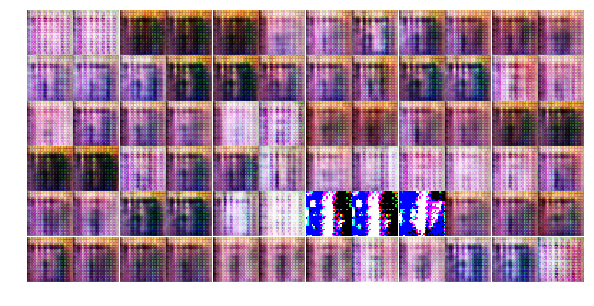

Epoch 4/10... Qfunction Loss: 0.6923413276672363 Generator Loss: 18.846973419189453 Discriminator Loss: 0.0006207139231264591
Epoch 4/10... Qfunction Loss: 0.6966276168823242 Generator Loss: 14.043439865112305 Discriminator Loss: 0.006632792763411999
Epoch 4/10... Qfunction Loss: 0.7029888033866882 Generator Loss: 15.424633026123047 Discriminator Loss: 0.004473410081118345
Epoch 4/10... Qfunction Loss: 0.6973681449890137 Generator Loss: 16.537559509277344 Discriminator Loss: 0.0036923326551914215
Epoch 4/10... Qfunction Loss: 0.6979710459709167 Generator Loss: 10.787731170654297 Discriminator Loss: 0.2447042167186737
Epoch 4/10... Qfunction Loss: 0.6872441172599792 Generator Loss: 17.736875534057617 Discriminator Loss: 0.013871103525161743
Epoch 4/10... Qfunction Loss: 0.6910482048988342 Generator Loss: 10.484060287475586 Discriminator Loss: 0.04870692640542984
Epoch 4/10... Qfunction Loss: 0.6878563761711121 Generator Loss: 11.004842758178711 Discriminator Loss: 0.04654316231608391
Ep

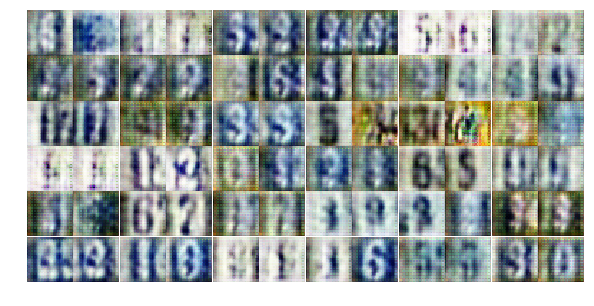

Epoch 5/10... Qfunction Loss: 0.6842589378356934 Generator Loss: 11.228048324584961 Discriminator Loss: 0.04514988884329796
Epoch 5/10... Qfunction Loss: 0.6808127760887146 Generator Loss: 9.066866874694824 Discriminator Loss: 0.0700819343328476
Epoch 5/10... Qfunction Loss: 0.6918573975563049 Generator Loss: 9.611344337463379 Discriminator Loss: 0.07902586460113525
Epoch 5/10... Qfunction Loss: 0.6977214813232422 Generator Loss: 16.11504364013672 Discriminator Loss: 0.003178741317242384
Epoch 5/10... Qfunction Loss: 0.6800020337104797 Generator Loss: 14.983419418334961 Discriminator Loss: 0.006559215951710939
Epoch 5/10... Qfunction Loss: 0.6887960433959961 Generator Loss: 16.157676696777344 Discriminator Loss: 0.003851525252684951
Epoch 5/10... Qfunction Loss: 0.6910988688468933 Generator Loss: 12.662776947021484 Discriminator Loss: 0.011207912117242813
Epoch 5/10... Qfunction Loss: 0.6851563453674316 Generator Loss: 13.558796882629395 Discriminator Loss: 0.008629466407001019
Epoch 5

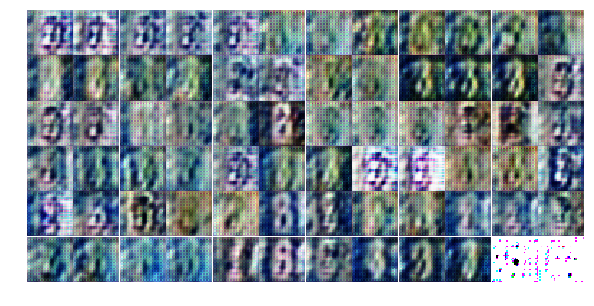

Epoch 5/10... Qfunction Loss: 0.6781139373779297 Generator Loss: 10.443561553955078 Discriminator Loss: 0.3484174311161041
Epoch 5/10... Qfunction Loss: 0.6899237632751465 Generator Loss: 15.682273864746094 Discriminator Loss: 0.029710255563259125
Epoch 5/10... Qfunction Loss: 0.6791834235191345 Generator Loss: 11.231810569763184 Discriminator Loss: 0.024256208911538124
Epoch 5/10... Qfunction Loss: 0.6822935938835144 Generator Loss: 12.388577461242676 Discriminator Loss: 0.039005082100629807
Epoch 5/10... Qfunction Loss: 0.6878789067268372 Generator Loss: 13.365470886230469 Discriminator Loss: 0.23891988396644592
Epoch 5/10... Qfunction Loss: 0.6862294673919678 Generator Loss: 12.028804779052734 Discriminator Loss: 0.018068095669150352
Epoch 5/10... Qfunction Loss: 0.681212842464447 Generator Loss: 12.564517974853516 Discriminator Loss: 0.018147481605410576
Epoch 5/10... Qfunction Loss: 0.6787195205688477 Generator Loss: 12.105979919433594 Discriminator Loss: 0.012333963997662067
Epoc

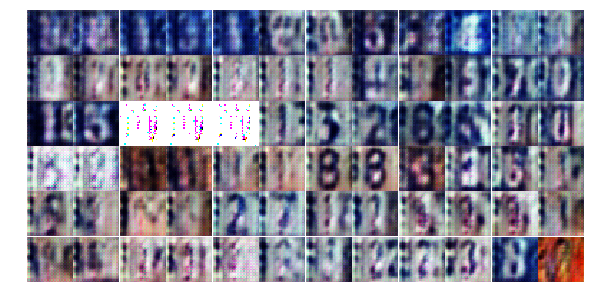

Epoch 5/10... Qfunction Loss: 0.6954949498176575 Generator Loss: 12.947807312011719 Discriminator Loss: 0.007916117087006569
Epoch 5/10... Qfunction Loss: 0.6861553192138672 Generator Loss: 12.743515014648438 Discriminator Loss: 0.014994199387729168
Epoch 5/10... Qfunction Loss: 0.6857526898384094 Generator Loss: 12.907302856445312 Discriminator Loss: 0.01064113900065422
Epoch 5/10... Qfunction Loss: 0.6974733471870422 Generator Loss: 16.474285125732422 Discriminator Loss: 0.013456365093588829
Epoch 5/10... Qfunction Loss: 0.6787402033805847 Generator Loss: 9.864297866821289 Discriminator Loss: 0.03201881796121597
Epoch 5/10... Qfunction Loss: 0.6817339062690735 Generator Loss: 13.463377952575684 Discriminator Loss: 0.010851732455193996
Epoch 5/10... Qfunction Loss: 0.6801950335502625 Generator Loss: 13.779157638549805 Discriminator Loss: 0.021118726581335068
Epoch 5/10... Qfunction Loss: 0.6924567222595215 Generator Loss: 15.042561531066895 Discriminator Loss: 0.013806873001158237
Epo

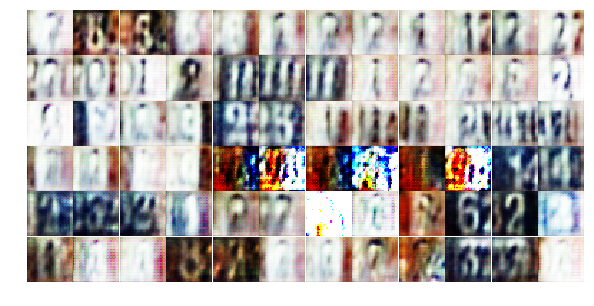

Epoch 5/10... Qfunction Loss: 0.6823301315307617 Generator Loss: 15.416645050048828 Discriminator Loss: 0.0030700548086315393
Epoch 5/10... Qfunction Loss: 0.6876704096794128 Generator Loss: 12.928749084472656 Discriminator Loss: 0.014149157330393791
Epoch 5/10... Qfunction Loss: 0.6810452342033386 Generator Loss: 12.762877464294434 Discriminator Loss: 0.008891889825463295
Epoch 5/10... Qfunction Loss: 0.6823399662971497 Generator Loss: 13.214436531066895 Discriminator Loss: 0.009162292815744877
Epoch 5/10... Qfunction Loss: 0.6923548579216003 Generator Loss: 15.411890983581543 Discriminator Loss: 0.0028355647809803486
Epoch 5/10... Qfunction Loss: 0.6853094100952148 Generator Loss: 13.665789604187012 Discriminator Loss: 0.043427787721157074
Epoch 5/10... Qfunction Loss: 0.6811338067054749 Generator Loss: 8.731973648071289 Discriminator Loss: 0.09606814384460449
Epoch 5/10... Qfunction Loss: 0.7003397941589355 Generator Loss: 18.51295280456543 Discriminator Loss: 0.0016861918848007917


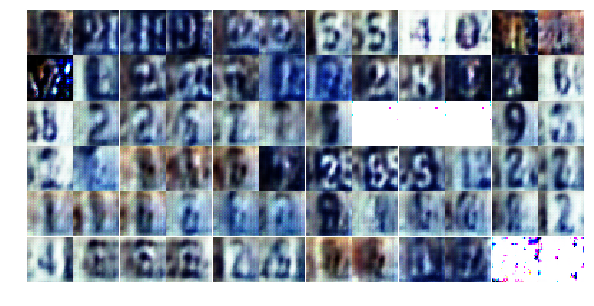

Epoch 5/10... Qfunction Loss: 0.6834405064582825 Generator Loss: 13.730627059936523 Discriminator Loss: 0.008731504902243614
Epoch 5/10... Qfunction Loss: 0.6844515800476074 Generator Loss: 14.039190292358398 Discriminator Loss: 0.01833718828856945
Epoch 5/10... Qfunction Loss: 0.6806672215461731 Generator Loss: 10.138876914978027 Discriminator Loss: 2.470712423324585
Epoch 5/10... Qfunction Loss: 0.6866477131843567 Generator Loss: 12.69715404510498 Discriminator Loss: 0.012393957003951073
Epoch 5/10... Qfunction Loss: 0.6881257891654968 Generator Loss: 14.252700805664062 Discriminator Loss: 0.009602714329957962
Epoch 5/10... Qfunction Loss: 0.6880642771720886 Generator Loss: 12.327375411987305 Discriminator Loss: 0.014619449153542519
Epoch 5/10... Qfunction Loss: 0.6841372847557068 Generator Loss: 12.414592742919922 Discriminator Loss: 0.014120073989033699
Epoch 5/10... Qfunction Loss: 0.6798195838928223 Generator Loss: 12.686759948730469 Discriminator Loss: 0.00955822691321373
Epoch 

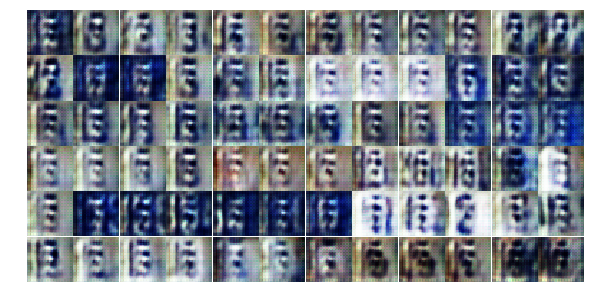

Epoch 5/10... Qfunction Loss: 0.6862564086914062 Generator Loss: 11.477317810058594 Discriminator Loss: 0.02414426952600479
Epoch 5/10... Qfunction Loss: 0.6911570429801941 Generator Loss: 13.188665390014648 Discriminator Loss: 0.06005158647894859
Epoch 5/10... Qfunction Loss: 0.688988208770752 Generator Loss: 15.341606140136719 Discriminator Loss: 0.03496279567480087
Epoch 5/10... Qfunction Loss: 0.68924480676651 Generator Loss: 14.469402313232422 Discriminator Loss: 0.006611546501517296
Epoch 5/10... Qfunction Loss: 0.6870667338371277 Generator Loss: 10.503349304199219 Discriminator Loss: 0.024936772882938385
Epoch 5/10... Qfunction Loss: 0.6934849619865417 Generator Loss: 15.670802116394043 Discriminator Loss: 0.005348201375454664
Epoch 6/10... Qfunction Loss: 0.6990792155265808 Generator Loss: 16.64171600341797 Discriminator Loss: 0.006338248495012522
Epoch 6/10... Qfunction Loss: 0.6927579045295715 Generator Loss: 12.96712875366211 Discriminator Loss: 0.009592296555638313
Epoch 6/

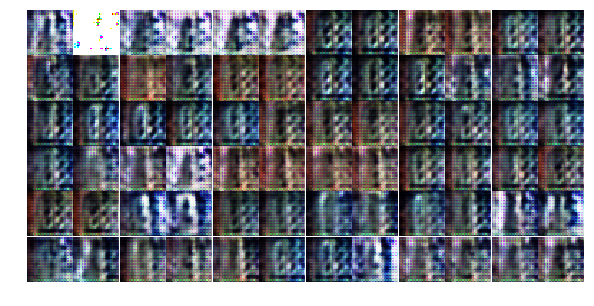

Epoch 6/10... Qfunction Loss: 0.69258713722229 Generator Loss: 19.625961303710938 Discriminator Loss: 0.000605506356805563
Epoch 6/10... Qfunction Loss: 0.6964842677116394 Generator Loss: 17.165706634521484 Discriminator Loss: 0.0011404035612940788
Epoch 6/10... Qfunction Loss: 0.6910593509674072 Generator Loss: 13.682191848754883 Discriminator Loss: 0.006827585864812136
Epoch 6/10... Qfunction Loss: 0.6967566609382629 Generator Loss: 16.39542007446289 Discriminator Loss: 0.005659931339323521
Epoch 6/10... Qfunction Loss: 0.6977365016937256 Generator Loss: 13.24183464050293 Discriminator Loss: 0.008539392612874508
Epoch 6/10... Qfunction Loss: 0.6907636523246765 Generator Loss: 19.637054443359375 Discriminator Loss: 0.0021589596290141344
Epoch 6/10... Qfunction Loss: 0.694907009601593 Generator Loss: 14.350147247314453 Discriminator Loss: 0.005478568375110626
Epoch 6/10... Qfunction Loss: 0.6924980282783508 Generator Loss: 12.200966835021973 Discriminator Loss: 0.016861137002706528
Epo

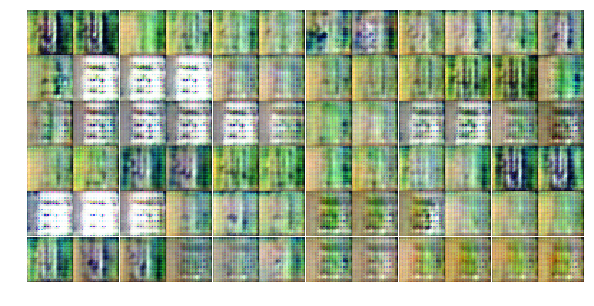

Epoch 6/10... Qfunction Loss: 0.6914946436882019 Generator Loss: 16.75819969177246 Discriminator Loss: 0.0032358141615986824
Epoch 6/10... Qfunction Loss: 0.6850245594978333 Generator Loss: 12.537692070007324 Discriminator Loss: 0.00923561118543148
Epoch 6/10... Qfunction Loss: 0.6857854723930359 Generator Loss: 11.27450942993164 Discriminator Loss: 0.024193257093429565
Epoch 6/10... Qfunction Loss: 0.6971462368965149 Generator Loss: 17.237628936767578 Discriminator Loss: 0.005967429839074612
Epoch 6/10... Qfunction Loss: 0.6796281933784485 Generator Loss: 12.672286987304688 Discriminator Loss: 0.030057156458497047
Epoch 6/10... Qfunction Loss: 0.6838586926460266 Generator Loss: 15.442989349365234 Discriminator Loss: 0.004917051177471876
Epoch 6/10... Qfunction Loss: 0.6905211806297302 Generator Loss: 13.707616806030273 Discriminator Loss: 0.012055277824401855
Epoch 6/10... Qfunction Loss: 0.6857574582099915 Generator Loss: 15.254631042480469 Discriminator Loss: 0.006144799292087555
Ep

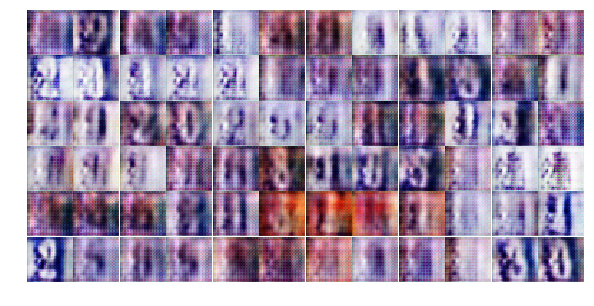

Epoch 6/10... Qfunction Loss: 0.6866205334663391 Generator Loss: 17.149978637695312 Discriminator Loss: 0.00250791828148067
Epoch 6/10... Qfunction Loss: 0.6816689968109131 Generator Loss: 15.940967559814453 Discriminator Loss: 0.0037073539569973946
Epoch 6/10... Qfunction Loss: 0.6850597262382507 Generator Loss: 21.166465759277344 Discriminator Loss: 0.00018412602366879582
Epoch 6/10... Qfunction Loss: 0.6940146088600159 Generator Loss: 18.059436798095703 Discriminator Loss: 0.0010665339650586247
Epoch 6/10... Qfunction Loss: 0.6888453364372253 Generator Loss: 12.879140853881836 Discriminator Loss: 0.013906856998801231
Epoch 6/10... Qfunction Loss: 0.6877506375312805 Generator Loss: 17.244009017944336 Discriminator Loss: 0.010280372574925423
Epoch 6/10... Qfunction Loss: 0.697135865688324 Generator Loss: 20.16359519958496 Discriminator Loss: 0.0009341298136860132
Epoch 6/10... Qfunction Loss: 0.6924965977668762 Generator Loss: 24.43798065185547 Discriminator Loss: 6.030190343153663e-0

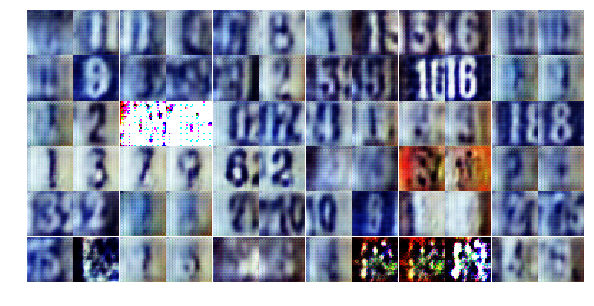

Epoch 6/10... Qfunction Loss: 0.685361385345459 Generator Loss: 9.934247016906738 Discriminator Loss: 0.07311054319143295
Epoch 6/10... Qfunction Loss: 0.690521240234375 Generator Loss: 14.041500091552734 Discriminator Loss: 0.01045712735503912
Epoch 6/10... Qfunction Loss: 0.6986801624298096 Generator Loss: 14.296895980834961 Discriminator Loss: 0.007358565926551819
Epoch 6/10... Qfunction Loss: 0.6923608779907227 Generator Loss: 12.6889066696167 Discriminator Loss: 0.008958365768194199
Epoch 6/10... Qfunction Loss: 0.6829948425292969 Generator Loss: 15.84435749053955 Discriminator Loss: 3.685943365097046
Epoch 6/10... Qfunction Loss: 0.6813947558403015 Generator Loss: 11.116233825683594 Discriminator Loss: 0.028840120881795883
Epoch 6/10... Qfunction Loss: 0.682321310043335 Generator Loss: 12.104312896728516 Discriminator Loss: 0.05533374100923538
Epoch 6/10... Qfunction Loss: 0.6879526972770691 Generator Loss: 12.980767250061035 Discriminator Loss: 0.014001276344060898
Epoch 6/10...

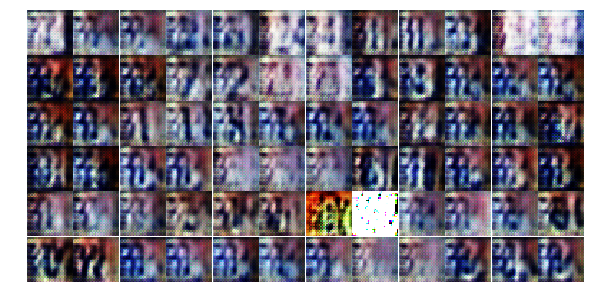

Epoch 6/10... Qfunction Loss: 0.7051911354064941 Generator Loss: 18.17346954345703 Discriminator Loss: 0.007938078604638577
Epoch 6/10... Qfunction Loss: 0.6795876622200012 Generator Loss: 11.831045150756836 Discriminator Loss: 0.020396778360009193
Epoch 6/10... Qfunction Loss: 0.6843481659889221 Generator Loss: 14.384241104125977 Discriminator Loss: 0.011853408999741077
Epoch 6/10... Qfunction Loss: 0.6823441386222839 Generator Loss: 13.448863983154297 Discriminator Loss: 0.018387924879789352
Epoch 6/10... Qfunction Loss: 0.6816675066947937 Generator Loss: 15.176136016845703 Discriminator Loss: 0.1332208514213562
Epoch 6/10... Qfunction Loss: 0.6879306435585022 Generator Loss: 8.849299430847168 Discriminator Loss: 0.06795607507228851
Epoch 6/10... Qfunction Loss: 0.6900930404663086 Generator Loss: 17.920936584472656 Discriminator Loss: 0.0009083005134016275
Epoch 6/10... Qfunction Loss: 0.6853893399238586 Generator Loss: 21.3387451171875 Discriminator Loss: 0.00014512971392832696
Epoc

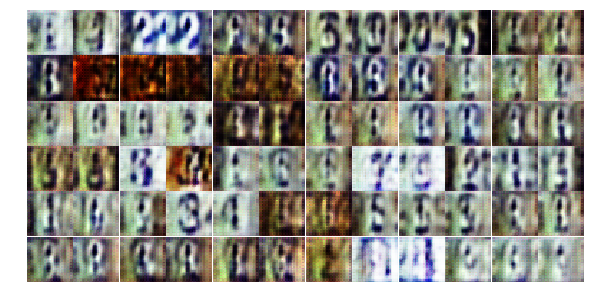

Epoch 6/10... Qfunction Loss: 0.6812941431999207 Generator Loss: 12.806013107299805 Discriminator Loss: 0.0117417573928833
Epoch 6/10... Qfunction Loss: 0.688848078250885 Generator Loss: 10.637150764465332 Discriminator Loss: 0.02098335325717926
Epoch 6/10... Qfunction Loss: 0.6871926188468933 Generator Loss: 10.20605754852295 Discriminator Loss: 0.034243177622556686
Epoch 7/10... Qfunction Loss: 0.695220947265625 Generator Loss: 13.48276138305664 Discriminator Loss: 0.007076566107571125
Epoch 7/10... Qfunction Loss: 0.6897609829902649 Generator Loss: 12.235282897949219 Discriminator Loss: 0.013535844162106514
Epoch 7/10... Qfunction Loss: 0.6991209983825684 Generator Loss: 15.699736595153809 Discriminator Loss: 0.002898044418543577
Epoch 7/10... Qfunction Loss: 0.698992908000946 Generator Loss: 15.020575523376465 Discriminator Loss: 0.005019227974116802
Epoch 7/10... Qfunction Loss: 0.702716588973999 Generator Loss: 10.651838302612305 Discriminator Loss: 0.03362639248371124
Epoch 7/10

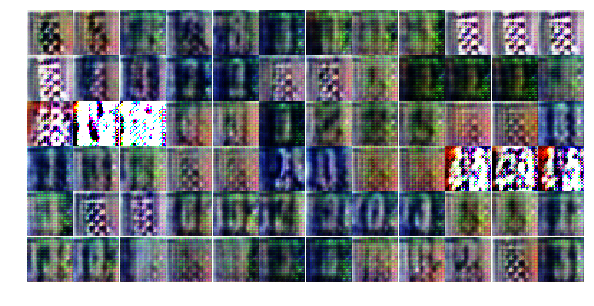

Epoch 7/10... Qfunction Loss: 0.6877022385597229 Generator Loss: 9.582277297973633 Discriminator Loss: 0.12281547486782074
Epoch 7/10... Qfunction Loss: 0.6884196400642395 Generator Loss: 13.738851547241211 Discriminator Loss: 0.015137918293476105
Epoch 7/10... Qfunction Loss: 0.6868371963500977 Generator Loss: 15.53870677947998 Discriminator Loss: 0.003995572216808796
Epoch 7/10... Qfunction Loss: 0.6879529356956482 Generator Loss: 15.080446243286133 Discriminator Loss: 0.00790056400001049
Epoch 7/10... Qfunction Loss: 0.6871355175971985 Generator Loss: 18.47840118408203 Discriminator Loss: 0.0034500195179134607
Epoch 7/10... Qfunction Loss: 0.6916925311088562 Generator Loss: 14.564216613769531 Discriminator Loss: 0.005862122401595116
Epoch 7/10... Qfunction Loss: 0.6912498474121094 Generator Loss: 13.596783638000488 Discriminator Loss: 0.009262082166969776
Epoch 7/10... Qfunction Loss: 0.6863253116607666 Generator Loss: 17.96115493774414 Discriminator Loss: 0.0600803904235363
Epoch 7

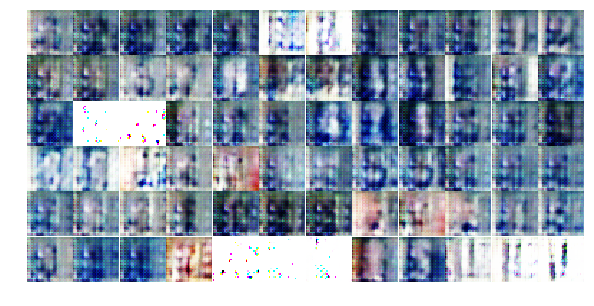

Epoch 7/10... Qfunction Loss: 0.6931664943695068 Generator Loss: 22.345165252685547 Discriminator Loss: 0.016081826761364937
Epoch 7/10... Qfunction Loss: 0.6879415512084961 Generator Loss: 20.053016662597656 Discriminator Loss: 0.0013816331047564745
Epoch 7/10... Qfunction Loss: 0.6838586330413818 Generator Loss: 14.334205627441406 Discriminator Loss: 0.005003965459764004
Epoch 7/10... Qfunction Loss: 0.7024044990539551 Generator Loss: 21.883459091186523 Discriminator Loss: 0.005420928355306387
Epoch 7/10... Qfunction Loss: 0.6763566136360168 Generator Loss: 12.451910972595215 Discriminator Loss: 0.013033581897616386
Epoch 7/10... Qfunction Loss: 0.6819801926612854 Generator Loss: 18.670793533325195 Discriminator Loss: 0.0005823146202601492
Epoch 7/10... Qfunction Loss: 0.6882583498954773 Generator Loss: 17.206926345825195 Discriminator Loss: 0.002084173262119293
Epoch 7/10... Qfunction Loss: 0.6794598698616028 Generator Loss: 16.965251922607422 Discriminator Loss: 0.00782601255923509

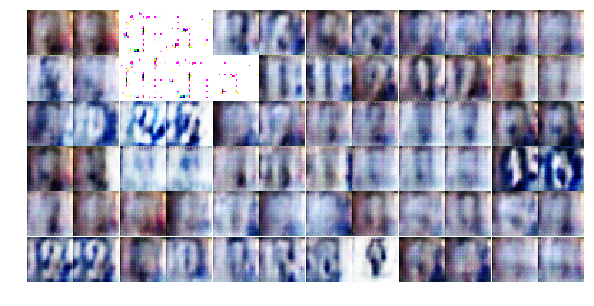

Epoch 7/10... Qfunction Loss: 0.6877951622009277 Generator Loss: 19.192035675048828 Discriminator Loss: 0.00577985355630517
Epoch 7/10... Qfunction Loss: 0.6845405697822571 Generator Loss: 10.616754531860352 Discriminator Loss: 0.023937225341796875
Epoch 7/10... Qfunction Loss: 0.6861939430236816 Generator Loss: 17.53573989868164 Discriminator Loss: 0.0038529913872480392
Epoch 7/10... Qfunction Loss: 0.6862700581550598 Generator Loss: 15.746803283691406 Discriminator Loss: 0.005188127513974905
Epoch 7/10... Qfunction Loss: 0.6828635334968567 Generator Loss: 15.780305862426758 Discriminator Loss: 0.0033253030851483345
Epoch 7/10... Qfunction Loss: 0.688443124294281 Generator Loss: 16.540584564208984 Discriminator Loss: 0.005981069058179855
Epoch 7/10... Qfunction Loss: 0.7113964557647705 Generator Loss: 21.24273109436035 Discriminator Loss: 0.00035812007263302803
Epoch 7/10... Qfunction Loss: 0.6928574442863464 Generator Loss: 19.641016006469727 Discriminator Loss: 0.006150348577648401


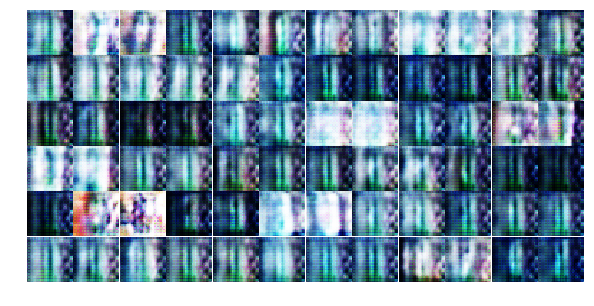

Epoch 7/10... Qfunction Loss: 0.6933267712593079 Generator Loss: 22.1826171875 Discriminator Loss: 0.00012978643644601107
Epoch 7/10... Qfunction Loss: 0.6850776076316833 Generator Loss: 13.664244651794434 Discriminator Loss: 0.007958151400089264
Epoch 7/10... Qfunction Loss: 0.7217901349067688 Generator Loss: 16.533016204833984 Discriminator Loss: 0.002090850379317999
Epoch 7/10... Qfunction Loss: 0.6996596455574036 Generator Loss: 18.37322998046875 Discriminator Loss: 0.0013097511837258935
Epoch 7/10... Qfunction Loss: 0.6997522711753845 Generator Loss: 19.359785079956055 Discriminator Loss: 0.0015348042361438274
Epoch 7/10... Qfunction Loss: 0.7065110206604004 Generator Loss: 16.54450035095215 Discriminator Loss: 0.003189191920682788
Epoch 7/10... Qfunction Loss: 0.6957888603210449 Generator Loss: 14.007488250732422 Discriminator Loss: 0.005431230179965496
Epoch 7/10... Qfunction Loss: 0.7047155499458313 Generator Loss: 18.11048126220703 Discriminator Loss: 0.00121060642413795
Epoch

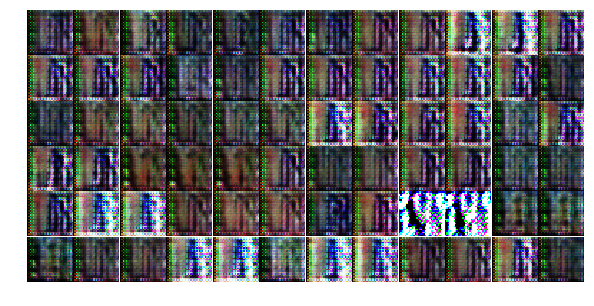

Epoch 7/10... Qfunction Loss: 0.7067764401435852 Generator Loss: 17.74574089050293 Discriminator Loss: 0.0017174556851387024
Epoch 7/10... Qfunction Loss: 0.7027357220649719 Generator Loss: 18.280101776123047 Discriminator Loss: 0.001903403433971107
Epoch 7/10... Qfunction Loss: 0.6988415122032166 Generator Loss: 15.441583633422852 Discriminator Loss: 0.004579095169901848
Epoch 7/10... Qfunction Loss: 0.6985875964164734 Generator Loss: 15.225902557373047 Discriminator Loss: 0.004377777688205242
Epoch 7/10... Qfunction Loss: 0.6927661895751953 Generator Loss: 18.665603637695312 Discriminator Loss: 0.0005733732250519097
Epoch 7/10... Qfunction Loss: 0.6963356137275696 Generator Loss: 20.234182357788086 Discriminator Loss: 0.0018794964998960495
Epoch 7/10... Qfunction Loss: 0.6981928944587708 Generator Loss: 19.66021728515625 Discriminator Loss: 0.0009844197193160653
Epoch 7/10... Qfunction Loss: 0.6958391070365906 Generator Loss: 19.008026123046875 Discriminator Loss: 0.00102450523991137

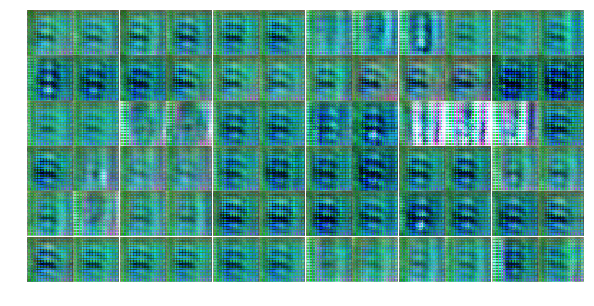

Epoch 7/10... Qfunction Loss: 0.708280086517334 Generator Loss: 19.447662353515625 Discriminator Loss: 0.0012743924744427204
Epoch 8/10... Qfunction Loss: 0.6922400593757629 Generator Loss: 16.590206146240234 Discriminator Loss: 0.002509199781343341
Epoch 8/10... Qfunction Loss: 0.694847822189331 Generator Loss: 17.33660125732422 Discriminator Loss: 0.0018499641446396708
Epoch 8/10... Qfunction Loss: 0.6952511668205261 Generator Loss: 17.767333984375 Discriminator Loss: 0.0011021726531907916
Epoch 8/10... Qfunction Loss: 0.6996445059776306 Generator Loss: 18.889427185058594 Discriminator Loss: 0.0009577953023836017
Epoch 8/10... Qfunction Loss: 0.6982343196868896 Generator Loss: 20.372608184814453 Discriminator Loss: 0.00044442020589485765
Epoch 8/10... Qfunction Loss: 0.6960292458534241 Generator Loss: 18.773746490478516 Discriminator Loss: 0.003922191448509693
Epoch 8/10... Qfunction Loss: 0.6978803277015686 Generator Loss: 15.394511222839355 Discriminator Loss: 0.004320376552641392


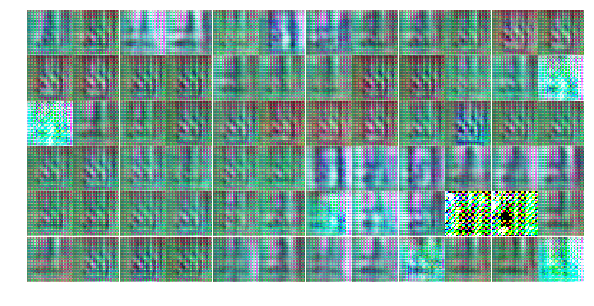

Epoch 8/10... Qfunction Loss: 0.6978028416633606 Generator Loss: 16.916948318481445 Discriminator Loss: 0.0013867251109331846
Epoch 8/10... Qfunction Loss: 0.6898908019065857 Generator Loss: 18.829547882080078 Discriminator Loss: 0.0036689627449959517
Epoch 8/10... Qfunction Loss: 0.6919938921928406 Generator Loss: 17.04242515563965 Discriminator Loss: 0.0024936338886618614
Epoch 8/10... Qfunction Loss: 0.6934123039245605 Generator Loss: 14.35543441772461 Discriminator Loss: 0.010085277259349823
Epoch 8/10... Qfunction Loss: 0.6937127113342285 Generator Loss: 19.339797973632812 Discriminator Loss: 0.0011586436303332448
Epoch 8/10... Qfunction Loss: 0.6927449107170105 Generator Loss: 17.88656234741211 Discriminator Loss: 0.0050462232902646065
Epoch 8/10... Qfunction Loss: 0.6925269961357117 Generator Loss: 14.81948184967041 Discriminator Loss: 0.004500710871070623
Epoch 8/10... Qfunction Loss: 0.6932716369628906 Generator Loss: 15.68174934387207 Discriminator Loss: 0.013517158105969429


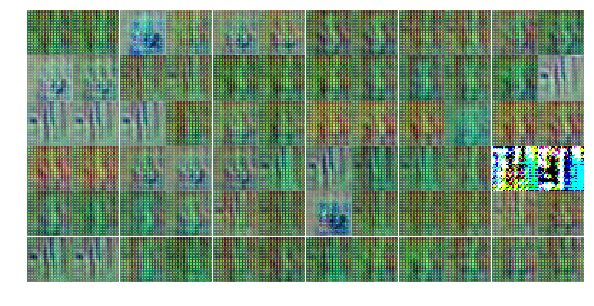

Epoch 8/10... Qfunction Loss: 0.6953172087669373 Generator Loss: 20.036205291748047 Discriminator Loss: 0.0013330613728612661
Epoch 8/10... Qfunction Loss: 0.6944701671600342 Generator Loss: 13.28615951538086 Discriminator Loss: 0.010570245794951916
Epoch 8/10... Qfunction Loss: 0.6930668354034424 Generator Loss: 17.006317138671875 Discriminator Loss: 0.0153562156483531
Epoch 8/10... Qfunction Loss: 0.695554256439209 Generator Loss: 18.223825454711914 Discriminator Loss: 0.001979654422029853
Epoch 8/10... Qfunction Loss: 0.6942896842956543 Generator Loss: 18.83512306213379 Discriminator Loss: 0.007038547657430172
Epoch 8/10... Qfunction Loss: 0.693596601486206 Generator Loss: 16.693674087524414 Discriminator Loss: 0.009518055245280266
Epoch 8/10... Qfunction Loss: 0.6922923922538757 Generator Loss: 17.22492027282715 Discriminator Loss: 0.002454890636727214
Epoch 8/10... Qfunction Loss: 0.693429708480835 Generator Loss: 20.00598907470703 Discriminator Loss: 0.002434647409245372
Epoch 8/

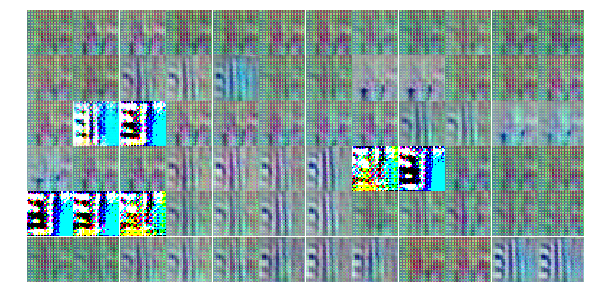

Epoch 8/10... Qfunction Loss: 0.6941416263580322 Generator Loss: 20.66443634033203 Discriminator Loss: 0.002517492277547717
Epoch 8/10... Qfunction Loss: 0.6917287707328796 Generator Loss: 18.646379470825195 Discriminator Loss: 0.002809743396937847
Epoch 8/10... Qfunction Loss: 0.6929335594177246 Generator Loss: 17.363529205322266 Discriminator Loss: 0.002368444111198187
Epoch 8/10... Qfunction Loss: 0.692467987537384 Generator Loss: 18.43063735961914 Discriminator Loss: 0.0038517857901751995
Epoch 8/10... Qfunction Loss: 0.6927278637886047 Generator Loss: 18.62193489074707 Discriminator Loss: 0.0026059348601847887
Epoch 8/10... Qfunction Loss: 0.6938573718070984 Generator Loss: 18.67961883544922 Discriminator Loss: 0.001488157780840993
Epoch 8/10... Qfunction Loss: 0.6959662437438965 Generator Loss: 18.7955265045166 Discriminator Loss: 0.0013832064578309655
Epoch 8/10... Qfunction Loss: 0.6941699981689453 Generator Loss: 16.713685989379883 Discriminator Loss: 0.005022358149290085
Epoc

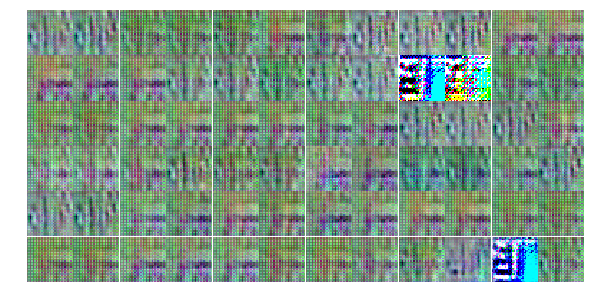

Epoch 8/10... Qfunction Loss: 0.6948073506355286 Generator Loss: 19.59563446044922 Discriminator Loss: 0.001928563928231597
Epoch 8/10... Qfunction Loss: 0.6942345499992371 Generator Loss: 18.6129150390625 Discriminator Loss: 0.003571375273168087
Epoch 8/10... Qfunction Loss: 0.696675717830658 Generator Loss: 18.58072280883789 Discriminator Loss: 0.001525278203189373
Epoch 8/10... Qfunction Loss: 0.6941685676574707 Generator Loss: 18.937450408935547 Discriminator Loss: 0.0024538577999919653
Epoch 8/10... Qfunction Loss: 0.6943309903144836 Generator Loss: 21.636577606201172 Discriminator Loss: 0.001239991863258183
Epoch 8/10... Qfunction Loss: 0.6926875114440918 Generator Loss: 21.530920028686523 Discriminator Loss: 0.0010608395095914602
Epoch 8/10... Qfunction Loss: 0.6929410099983215 Generator Loss: 15.072887420654297 Discriminator Loss: 0.0029845917597413063
Epoch 8/10... Qfunction Loss: 0.6955976486206055 Generator Loss: 20.035823822021484 Discriminator Loss: 0.00043607965926639736


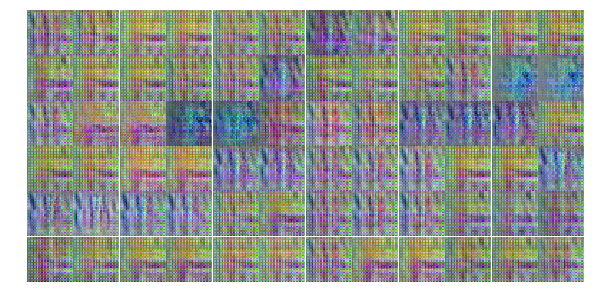

Epoch 8/10... Qfunction Loss: 0.6939668655395508 Generator Loss: 19.892921447753906 Discriminator Loss: 0.0006781980628147721
Epoch 8/10... Qfunction Loss: 0.6931303143501282 Generator Loss: 17.3829402923584 Discriminator Loss: 0.0019289334304630756
Epoch 8/10... Qfunction Loss: 0.6954266428947449 Generator Loss: 17.375783920288086 Discriminator Loss: 0.0014215330593287945
Epoch 8/10... Qfunction Loss: 0.6939432621002197 Generator Loss: 18.23749542236328 Discriminator Loss: 0.0013917633332312107
Epoch 8/10... Qfunction Loss: 0.6949551701545715 Generator Loss: 20.08096694946289 Discriminator Loss: 0.0004439098120201379
Epoch 8/10... Qfunction Loss: 0.6937098503112793 Generator Loss: 18.472579956054688 Discriminator Loss: 0.001523180864751339
Epoch 8/10... Qfunction Loss: 0.6963281631469727 Generator Loss: 21.79471206665039 Discriminator Loss: 0.0003001199511345476
Epoch 8/10... Qfunction Loss: 0.6940400004386902 Generator Loss: 17.16961669921875 Discriminator Loss: 0.0016506925458088517

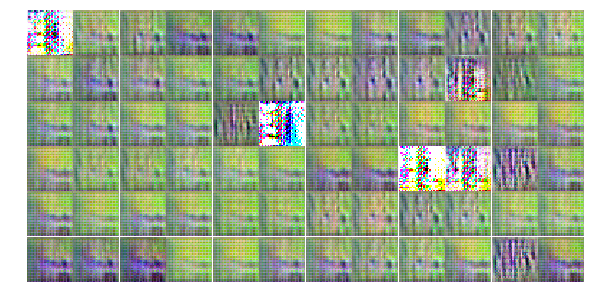

Epoch 9/10... Qfunction Loss: 0.6995113492012024 Generator Loss: 23.003799438476562 Discriminator Loss: 0.0004942516679875553
Epoch 9/10... Qfunction Loss: 0.7007191777229309 Generator Loss: 28.438905715942383 Discriminator Loss: 0.2172781378030777
Epoch 9/10... Qfunction Loss: 0.6984164118766785 Generator Loss: 20.036270141601562 Discriminator Loss: 0.009143396280705929
Epoch 9/10... Qfunction Loss: 0.6907475590705872 Generator Loss: 22.24932289123535 Discriminator Loss: 0.004609026480466127
Epoch 9/10... Qfunction Loss: 0.6962582468986511 Generator Loss: 26.932634353637695 Discriminator Loss: 5.931616306304932
Epoch 9/10... Qfunction Loss: 0.6936643719673157 Generator Loss: 17.864110946655273 Discriminator Loss: 0.34301459789276123
Epoch 9/10... Qfunction Loss: 0.6989223957061768 Generator Loss: 16.56314468383789 Discriminator Loss: 0.019534766674041748
Epoch 9/10... Qfunction Loss: 0.6986238360404968 Generator Loss: 18.205900192260742 Discriminator Loss: 0.0096542714163661
Epoch 9/1

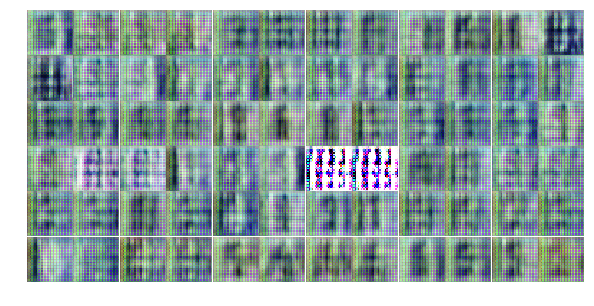

Epoch 9/10... Qfunction Loss: 0.6943261027336121 Generator Loss: 15.826116561889648 Discriminator Loss: 0.008261035196483135
Epoch 9/10... Qfunction Loss: 0.693803608417511 Generator Loss: 14.690112113952637 Discriminator Loss: 0.025286538526415825
Epoch 9/10... Qfunction Loss: 0.6881487369537354 Generator Loss: 18.99490737915039 Discriminator Loss: 0.002235299674794078
Epoch 9/10... Qfunction Loss: 0.6908071637153625 Generator Loss: 26.38408660888672 Discriminator Loss: 0.05299124866724014
Epoch 9/10... Qfunction Loss: 0.7166888117790222 Generator Loss: 14.183130264282227 Discriminator Loss: 1.4646062850952148
Epoch 9/10... Qfunction Loss: 0.6893579363822937 Generator Loss: 15.86929702758789 Discriminator Loss: 0.011470343917608261
Epoch 9/10... Qfunction Loss: 0.6888138651847839 Generator Loss: 13.570870399475098 Discriminator Loss: 0.15823829174041748
Epoch 9/10... Qfunction Loss: 0.6908066868782043 Generator Loss: 17.35424041748047 Discriminator Loss: 0.004933064803481102
Epoch 9/1

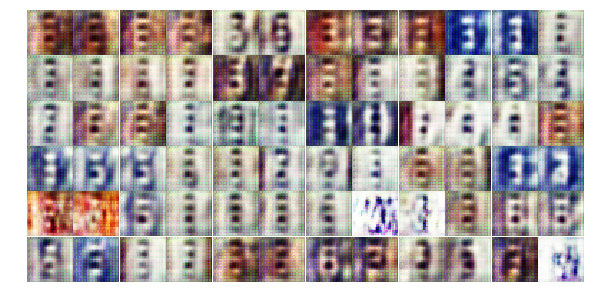

Epoch 9/10... Qfunction Loss: 0.6917378306388855 Generator Loss: 17.829723358154297 Discriminator Loss: 0.051399312913417816
Epoch 9/10... Qfunction Loss: 0.6898525357246399 Generator Loss: 18.43575668334961 Discriminator Loss: 0.0033992943353950977
Epoch 9/10... Qfunction Loss: 0.703671932220459 Generator Loss: 17.67448616027832 Discriminator Loss: 0.004255067557096481
Epoch 9/10... Qfunction Loss: 0.7033064961433411 Generator Loss: 15.568303108215332 Discriminator Loss: 0.010718673467636108
Epoch 9/10... Qfunction Loss: 0.6923408508300781 Generator Loss: 15.269886016845703 Discriminator Loss: 0.009522008709609509
Epoch 9/10... Qfunction Loss: 0.6886589527130127 Generator Loss: 13.617509841918945 Discriminator Loss: 0.010466924868524075
Epoch 9/10... Qfunction Loss: 0.7027015686035156 Generator Loss: 17.54363250732422 Discriminator Loss: 0.002358489204198122
Epoch 9/10... Qfunction Loss: 0.7014639973640442 Generator Loss: 16.595020294189453 Discriminator Loss: 0.002009060699492693
Epo

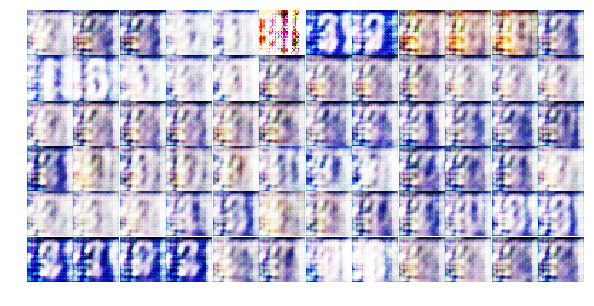

Epoch 9/10... Qfunction Loss: 0.7135041356086731 Generator Loss: 13.719560623168945 Discriminator Loss: 0.01788255386054516
Epoch 9/10... Qfunction Loss: 0.7072207927703857 Generator Loss: 15.84678840637207 Discriminator Loss: 0.05023419111967087
Epoch 9/10... Qfunction Loss: 0.7075086236000061 Generator Loss: 18.203115463256836 Discriminator Loss: 0.029929116368293762
Epoch 9/10... Qfunction Loss: 0.6931203007698059 Generator Loss: 17.21842384338379 Discriminator Loss: 0.09710811078548431
Epoch 9/10... Qfunction Loss: 0.6882649064064026 Generator Loss: 10.773984909057617 Discriminator Loss: 0.0358244962990284
Epoch 9/10... Qfunction Loss: 0.6905184388160706 Generator Loss: 14.209112167358398 Discriminator Loss: 0.008233444765210152
Epoch 9/10... Qfunction Loss: 0.6830968856811523 Generator Loss: 19.298707962036133 Discriminator Loss: 0.0005568844499066472
Epoch 9/10... Qfunction Loss: 0.6822478771209717 Generator Loss: 12.722029685974121 Discriminator Loss: 0.012015488930046558
Epoch 

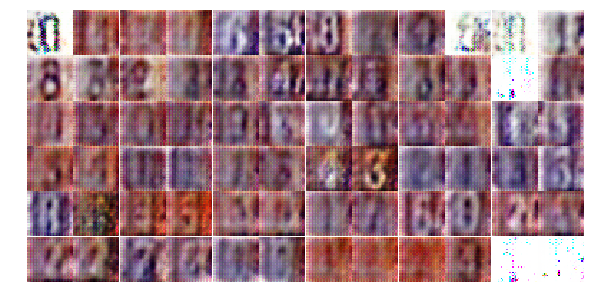

Epoch 9/10... Qfunction Loss: 0.6872771382331848 Generator Loss: 12.805412292480469 Discriminator Loss: 0.01942460983991623
Epoch 9/10... Qfunction Loss: 0.6866257786750793 Generator Loss: 13.367146492004395 Discriminator Loss: 0.027391701936721802
Epoch 9/10... Qfunction Loss: 0.6750689148902893 Generator Loss: 12.024261474609375 Discriminator Loss: 0.022123508155345917
Epoch 9/10... Qfunction Loss: 0.6859915852546692 Generator Loss: 16.320327758789062 Discriminator Loss: 0.06014326214790344
Epoch 9/10... Qfunction Loss: 0.6827053427696228 Generator Loss: 14.469666481018066 Discriminator Loss: 0.17107944190502167
Epoch 9/10... Qfunction Loss: 0.6836788058280945 Generator Loss: 21.723651885986328 Discriminator Loss: 0.001980437198653817
Epoch 9/10... Qfunction Loss: 0.6852388978004456 Generator Loss: 13.723851203918457 Discriminator Loss: 0.006789464969187975
Epoch 9/10... Qfunction Loss: 0.6773484349250793 Generator Loss: 11.543828010559082 Discriminator Loss: 0.01810964196920395
Epoc

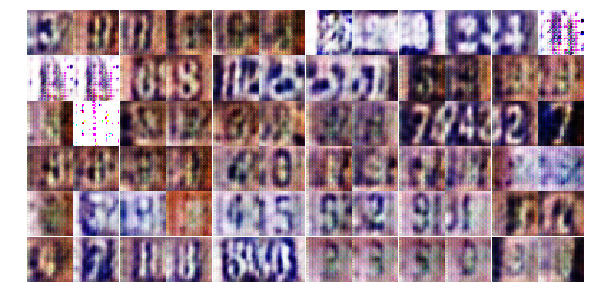

Epoch 9/10... Qfunction Loss: 0.6786360740661621 Generator Loss: 16.015552520751953 Discriminator Loss: 0.004826508928090334
Epoch 9/10... Qfunction Loss: 0.6898670196533203 Generator Loss: 17.253482818603516 Discriminator Loss: 0.006243704818189144
Epoch 9/10... Qfunction Loss: 0.6841480135917664 Generator Loss: 14.676244735717773 Discriminator Loss: 0.0036280439235270023
Epoch 9/10... Qfunction Loss: 0.6868128776550293 Generator Loss: 18.909259796142578 Discriminator Loss: 0.003287878120318055
Epoch 9/10... Qfunction Loss: 0.6825674176216125 Generator Loss: 14.265714645385742 Discriminator Loss: 0.0076182205229997635
Epoch 10/10... Qfunction Loss: 0.7262246012687683 Generator Loss: 20.614696502685547 Discriminator Loss: 0.224679097533226
Epoch 10/10... Qfunction Loss: 0.6884570121765137 Generator Loss: 11.935749053955078 Discriminator Loss: 0.03114338591694832
Epoch 10/10... Qfunction Loss: 0.6759490966796875 Generator Loss: 11.377609252929688 Discriminator Loss: 0.04931619018316269


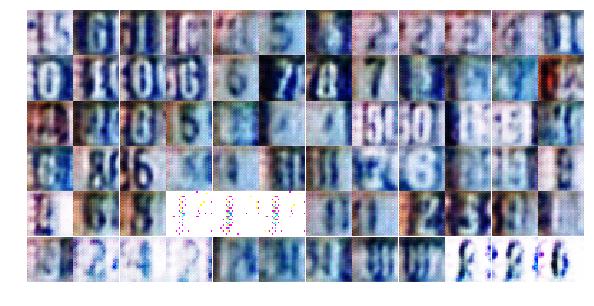

Epoch 10/10... Qfunction Loss: 0.6808306574821472 Generator Loss: 14.838798522949219 Discriminator Loss: 0.004941275808960199
Epoch 10/10... Qfunction Loss: 0.6861989498138428 Generator Loss: 17.09506607055664 Discriminator Loss: 0.0016075046733021736
Epoch 10/10... Qfunction Loss: 0.68031245470047 Generator Loss: 12.078611373901367 Discriminator Loss: 0.014796173200011253
Epoch 10/10... Qfunction Loss: 0.6848674416542053 Generator Loss: 14.876442909240723 Discriminator Loss: 0.0040195295587182045
Epoch 10/10... Qfunction Loss: 0.6831426620483398 Generator Loss: 16.360679626464844 Discriminator Loss: 0.002557082800194621
Epoch 10/10... Qfunction Loss: 0.6876023411750793 Generator Loss: 16.80966567993164 Discriminator Loss: 0.015561448410153389
Epoch 10/10... Qfunction Loss: 0.688069760799408 Generator Loss: 18.832656860351562 Discriminator Loss: 0.0005952059873379767
Epoch 10/10... Qfunction Loss: 0.6847963929176331 Generator Loss: 18.440330505371094 Discriminator Loss: 0.0005270931287

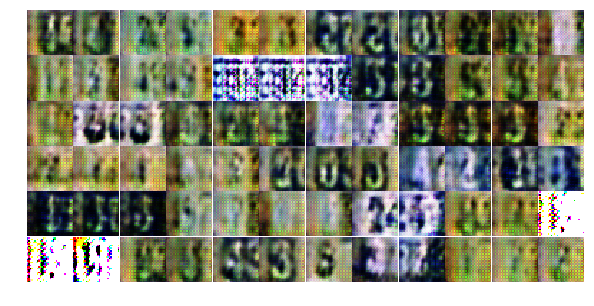

Epoch 10/10... Qfunction Loss: 0.6808570027351379 Generator Loss: 14.55827522277832 Discriminator Loss: 0.0058385892771184444
Epoch 10/10... Qfunction Loss: 0.6798205971717834 Generator Loss: 15.513283729553223 Discriminator Loss: 0.0030067600309848785
Epoch 10/10... Qfunction Loss: 0.6838486790657043 Generator Loss: 14.757843017578125 Discriminator Loss: 0.006848982535302639
Epoch 10/10... Qfunction Loss: 0.6813419461250305 Generator Loss: 18.916576385498047 Discriminator Loss: 0.0031076339073479176
Epoch 10/10... Qfunction Loss: 0.6832239031791687 Generator Loss: 15.905145645141602 Discriminator Loss: 0.0027530575171113014
Epoch 10/10... Qfunction Loss: 0.6897149682044983 Generator Loss: 12.72365951538086 Discriminator Loss: 0.013100977055728436
Epoch 10/10... Qfunction Loss: 0.6763274073600769 Generator Loss: 16.25252914428711 Discriminator Loss: 0.0020960038527846336
Epoch 10/10... Qfunction Loss: 0.6859664916992188 Generator Loss: 13.957138061523438 Discriminator Loss: 0.009812068

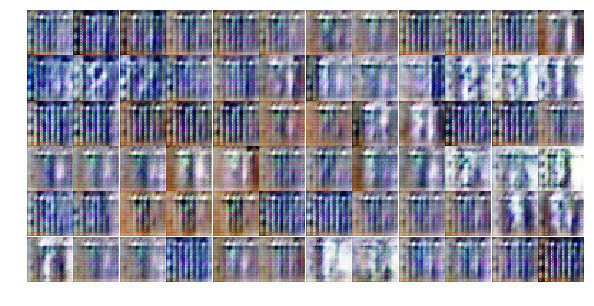

Epoch 10/10... Qfunction Loss: 0.6891997456550598 Generator Loss: 19.303375244140625 Discriminator Loss: 0.0007268920307978988
Epoch 10/10... Qfunction Loss: 0.6914548277854919 Generator Loss: 16.896591186523438 Discriminator Loss: 0.0018831081688404083
Epoch 10/10... Qfunction Loss: 0.6977971196174622 Generator Loss: 14.397598266601562 Discriminator Loss: 0.006520482245832682
Epoch 10/10... Qfunction Loss: 0.6959964632987976 Generator Loss: 16.875524520874023 Discriminator Loss: 0.004318808205425739
Epoch 10/10... Qfunction Loss: 0.6962764263153076 Generator Loss: 18.235633850097656 Discriminator Loss: 0.0010041019413620234
Epoch 10/10... Qfunction Loss: 0.693348228931427 Generator Loss: 15.992935180664062 Discriminator Loss: 0.003234918462112546
Epoch 10/10... Qfunction Loss: 0.7119413018226624 Generator Loss: 18.060731887817383 Discriminator Loss: 0.0013862467603757977
Epoch 10/10... Qfunction Loss: 0.6961691975593567 Generator Loss: 17.207578659057617 Discriminator Loss: 0.00101723

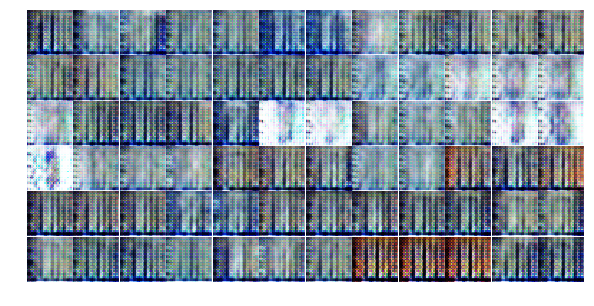

Epoch 10/10... Qfunction Loss: 0.6893486976623535 Generator Loss: 17.854957580566406 Discriminator Loss: 0.004868832882493734
Epoch 10/10... Qfunction Loss: 0.6828848719596863 Generator Loss: 14.940887451171875 Discriminator Loss: 0.004672782961279154
Epoch 10/10... Qfunction Loss: 0.6857247352600098 Generator Loss: 19.25018310546875 Discriminator Loss: 0.008773740381002426
Epoch 10/10... Qfunction Loss: 0.6802828907966614 Generator Loss: 16.593372344970703 Discriminator Loss: 0.0015737961512058973
Epoch 10/10... Qfunction Loss: 0.6917760372161865 Generator Loss: 23.85185432434082 Discriminator Loss: 0.0015281147789210081
Epoch 10/10... Qfunction Loss: 0.6872685551643372 Generator Loss: 17.60745620727539 Discriminator Loss: 0.001143034314736724
Epoch 10/10... Qfunction Loss: 0.6816032528877258 Generator Loss: 20.108312606811523 Discriminator Loss: 0.0018023110460489988
Epoch 10/10... Qfunction Loss: 0.679897129535675 Generator Loss: 18.48062515258789 Discriminator Loss: 0.0016729687340

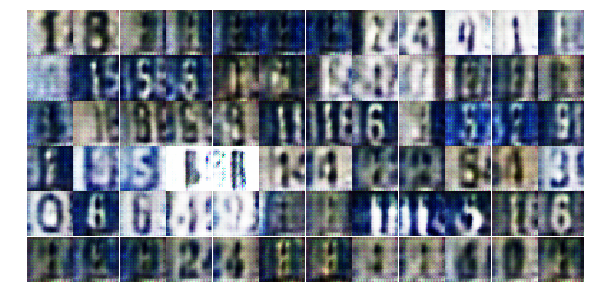

Epoch 10/10... Qfunction Loss: 0.6801674962043762 Generator Loss: 15.714803695678711 Discriminator Loss: 0.06789370626211166
Epoch 10/10... Qfunction Loss: 0.6767892837524414 Generator Loss: 16.296489715576172 Discriminator Loss: 0.002812979044392705
Epoch 10/10... Qfunction Loss: 0.6868414878845215 Generator Loss: 16.380796432495117 Discriminator Loss: 0.008070980198681355
Epoch 10/10... Qfunction Loss: 0.6888284683227539 Generator Loss: 24.851940155029297 Discriminator Loss: 0.0004641872947104275
Epoch 10/10... Qfunction Loss: 0.6799275279045105 Generator Loss: 17.058677673339844 Discriminator Loss: 0.001790420152246952
Epoch 10/10... Qfunction Loss: 0.6775884032249451 Generator Loss: 13.477598190307617 Discriminator Loss: 0.008030099794268608
Epoch 10/10... Qfunction Loss: 0.6912097930908203 Generator Loss: 21.572559356689453 Discriminator Loss: 0.0009106448851525784
Epoch 10/10... Qfunction Loss: 0.7070171236991882 Generator Loss: 32.974853515625 Discriminator Loss: 3.4071438221872

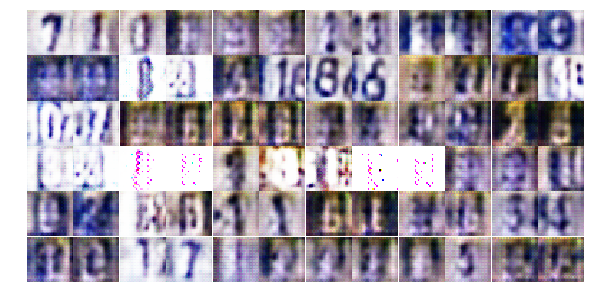

Epoch 10/10... Qfunction Loss: 0.6830549836158752 Generator Loss: 20.330949783325195 Discriminator Loss: 0.0012188875116407871
Epoch 10/10... Qfunction Loss: 0.683128833770752 Generator Loss: 21.255714416503906 Discriminator Loss: 0.000858750834595412
Epoch 10/10... Qfunction Loss: 0.7379185557365417 Generator Loss: 17.865365982055664 Discriminator Loss: 0.003814755706116557


In [22]:
losses, samples = train(model=model, dataset=dataset, epochs=epochs, batch_size=batch_size, figsize=(10,5))

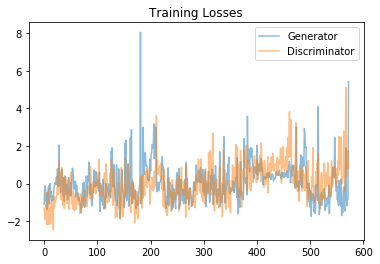

In [23]:
fig, ax = plt.subplots()
losses_ = np.array(losses)
losses_norm = (losses_ - losses_.mean(axis=0))/losses_.std(axis=0)
# print(losses_.shape, losses_norm.shape, losses_norm.dtype, losses_norm.dtype)
plt.plot(losses_norm.T[0], label='Generator', alpha=0.5)
plt.plot(losses_norm.T[1], label='Discriminator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

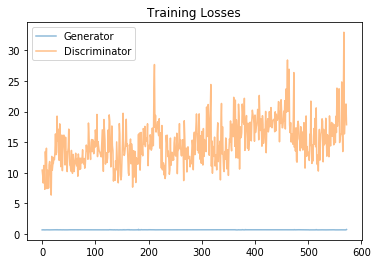

In [24]:
fig, ax = plt.subplots()
losses_ = np.array(losses)
plt.plot(losses_.T[0], label='Generator', alpha=0.5)
plt.plot(losses_.T[1], label='Discriminator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

/home/arasdar/anaconda3/envs/env/lib/python3.6/site-packages/matplotlib/axes/_base.py:1400: MatplotlibDeprecationWarning: The 'box-forced' keyword argument is deprecated since 2.2.
  " since 2.2.", cbook.mplDeprecation)


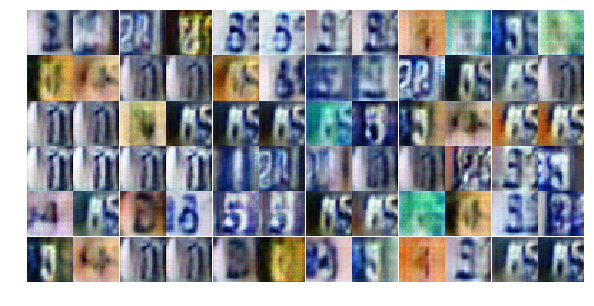

In [51]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))

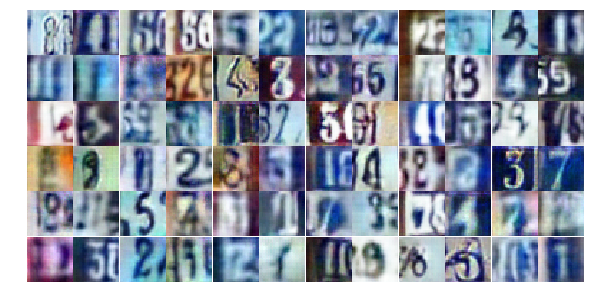

In [19]:
# Standard DCGAN
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))